In [1]:
!pip install shap
import shap
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

import tensorflow as tf    
tf.compat.v1.disable_v2_behavior() # <-- HERE !

print("SHAP version is:", shap.__version__)
print("Tensorflow version is:", tf.__version__)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 5.0 MB/s 
Instructions for updating:
non-resource variables are not supported in the long term
SHAP version is: 0.41.0
Tensorflow version is: 2.8.2


In [2]:
from matplotlib import pyplot as plt

In [3]:
model = tf.keras.models.load_model("/content/drive/MyDrive/dissertation/time_series_classification/rat1_pre/baseline_lstm2.h5")

In [4]:
print(model.layers[-1].output)

Tensor("dense_3/Softmax:0", shape=(?, 3), dtype=float32)


In [5]:
X= np.load("/content/drive/MyDrive/dissertation/rat1_X.npy")
y = np.load("/content/drive/MyDrive/dissertation/rat1_y.npy")

In [6]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.1, random_state = 8)
X_trn,X_val,y_trn,y_val = train_test_split(X_train,y_train,test_size = 0.1, random_state = 8)
print(X_trn.shape,X_val.shape,X_test.shape)

(210, 17, 138) (24, 17, 138) (27, 17, 138)


In [7]:
import scipy.io
data = scipy.io.loadmat("/content/drive/MyDrive/dissertation/LearningData(1).mat")
print(data.keys())

dict_keys(['__header__', '__version__', '__globals__', 'CELLLAB_ALL', 'rmat_post', 'rmat_pre', 'tMOT', 'tsamples', 'vmatpost', 'vmatpre'])


1 - PYR(red)
3 - PV(blue)
4 - SOM(green)
5 - VIP(yellow)
2 - NONE

y labels 0-vertical, 1-angled, 2-gray corridor

In [8]:
y_test

array([2, 1, 2, 2, 0, 0, 1, 1, 1, 1, 2, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 2,
       0, 2, 1, 2, 2])

In [9]:
ypred = np.argmax(model.predict(X_test), axis = 1)
print(ypred.shape, ypred)

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


(27,) [2 1 2 2 0 0 1 1 1 1 2 0 2 0 0 2 0 2 0 2 2 2 2 2 1 2 2]


In [11]:
def analysis_shap(model,i):
  plt.rcParams["figure.figsize"] = (30,10)
  ypred = np.argmax(model.predict(X_test), axis = 1)
  #print(ypred.shape, ypred)
  features = list(range(0,138))
  explainer = shap.DeepExplainer(model,X_trn)
  d={1:[],3:[],4:[],5:[]}
  if(ypred[i] == y_test[i]):
      print("class = {}".format(ypred[i]))
      b = X_test[i].reshape(1,17,138)
      shap_values = explainer.shap_values(b)[ypred[i]]
      print(shap_values.shape)
      before_stimulus = np.take(shap_values,np.array(list(range(0,8))), axis = 1)
      print(before_stimulus.shape)
      after_stimulus = np.take(shap_values,np.array(list(range(8,17))), axis = 1)
      print(after_stimulus.shape)
      m1 = np.mean(before_stimulus, axis = 1)
      print(m1.shape)
      m2 = np.mean(after_stimulus, axis = 1)
      print(m2.shape)
      a = data['CELLLAB_ALL'][0][0].reshape(138)
      print(a)
      unique, counts = np.unique(a, return_counts=True)
      print(unique,counts)
      for cell in unique:
        ind = np.where(a == cell)
        #print(cell,ind)
        d[cell].append(np.mean(np.take(m1,ind, axis = 1)))
        d[cell].append(np.mean(np.take(m2,ind,axis = 1)))
        print(np.mean(np.take(m1,ind,axis = 1)))
        print(np.mean(np.take(m2,ind,axis = 1)))
  return d

In [12]:
d = analysis_shap(model,1) 
print(d)

keras is no longer supported, please use tf.keras instead.
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


class = 1
(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.0003348591436825995
0.0003021446740930201
7.203534424723064e-05
4.378643677787969e-05
0.00016477247089596858
5.045840601897431e-05
0.001203661170649184
0.0002529931190906609
{1: [0.0003348591436825995, 0.0003021446740930201], 3: [7.203534424723064e-05, 4.378643677787969e-05], 4: [0.00016477247089596858, 5.045840601897431e-05], 5: [0.001203661170649184, 0.0002529931190906609]}


In [13]:
def plot_importance(d):
  l1,l2 = [],[]
  plt.rcParams["figure.figsize"] = (8,6)
  for key in d.keys():
    l1.append(d[key][0])
    l2.append(d[key][1])
  cells = ["PYR","PV","SOM","VIP"]
  x_axis = np.arange(len(cells))
  plt.bar(x_axis -0.2, l1, width=0.4, label = 'before_stimulus_onset')
  plt.bar(x_axis +0.2, l2, width=0.4, label = 'after_stimulus_onset')
  plt.xticks(x_axis, cells)
  plt.xlabel("cell type")
  plt.ylabel("Feature Importance")
  plt.legend()
  plt.show()

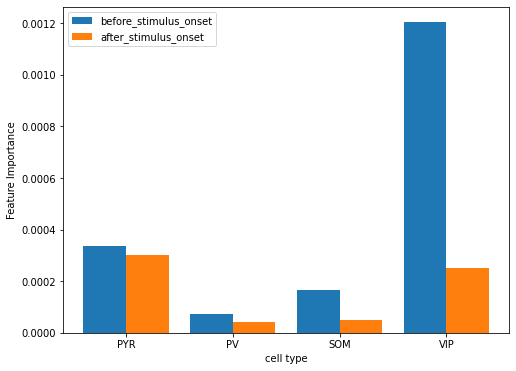

In [14]:
plot_importance(d)

In [ ]:
def plot_importance_without_pyr(d):
  l1,l2 = [],[]
  plt.rcParams["figure.figsize"] = (8,6)
  for key in d.keys():
    if(key != 1):
      l1.append(d[key][0])
      l2.append(d[key][1])
  cells = ["PV","SOM","VIP"]
  x_axis = np.arange(len(cells))
  plt.bar(x_axis -0.2, l1, width=0.4, label = 'before_stimulus_onset')
  plt.bar(x_axis +0.2, l2, width=0.4, label = 'after_stimulus_onset')
  plt.xticks(x_axis, cells)
  plt.xlabel("cell type")
  plt.ylabel("Feature Importance")
  plt.legend()
  plt.show()

###class = 0

4
class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.00028182546789967775
0.0003010004924058542
2.86579556108002e-05
3.0399467363335154e-05
0.00036510750901389395
7.208987836921075e-05
0.0012185619042952567
0.00045516148548567037


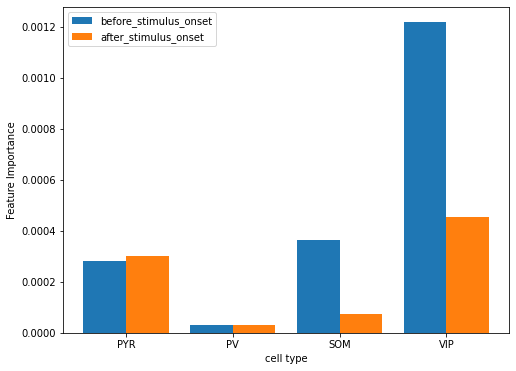

5
class = 0
(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.00032531260380274605
0.0003183366224264348
1.2549669509513231e-05
-9.046817380235722e-06
0.00026588288307851016
2.5814023080065742e-05
0.0008976498411072953
0.00019474674409675826


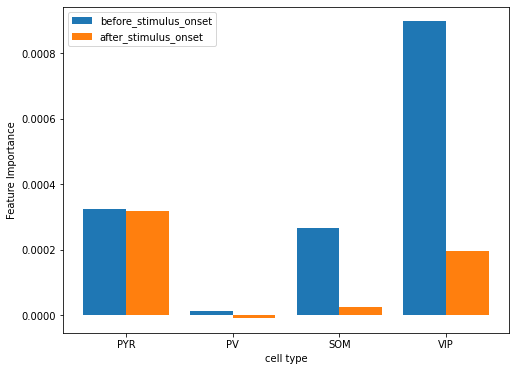

11
class = 0
(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.0002667400284506003
0.0002706865468917465
3.411767243240623e-05
6.88150786577016e-05
0.00033402268601940524
0.00010203785228127126
0.0015649849165129126
0.0005025088977793265


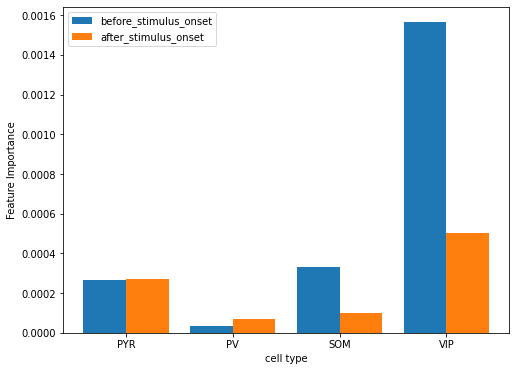

13
class = 0
(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.00035477680955028174
0.00034371588253760286
5.89994281795884e-05
4.9660477010341446e-05
0.00039612066445572836
9.74534166343368e-05
-0.00012610803411883253
-4.217801579721304e-05


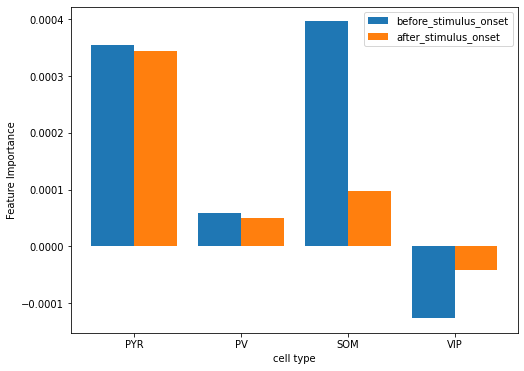

14
class = 0
(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.0004035651210807011
0.00023524746134051384
4.030150214854681e-05
-8.531859483373049e-05
0.0002495831834364383
6.18572794806708e-05
0.0005581065182127531
0.00020518068115886007


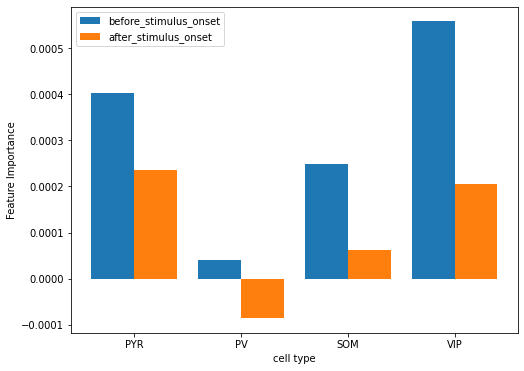

16
class = 0
(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.000338158117203578
0.00033672247928963984
3.395974430257335e-05
8.802888657929071e-05
0.0007032125526750731
0.00010045241259153016
-0.00010913205943552384
3.097035496087604e-05


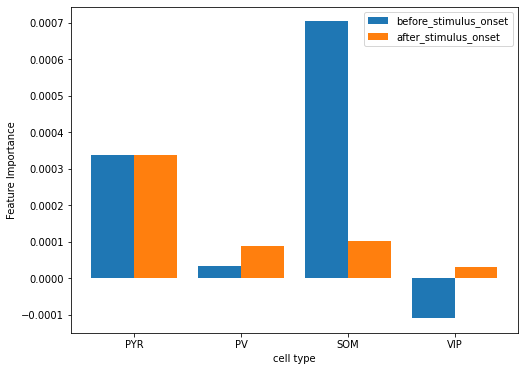

18
class = 0
(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.0001451994801126841
0.0002074823059917691
0.0001312056108364601
0.00015225582183752017
0.0001480544545781218
-3.0553606147949485e-05
-0.0007802124036828673
-0.00012047221252942113


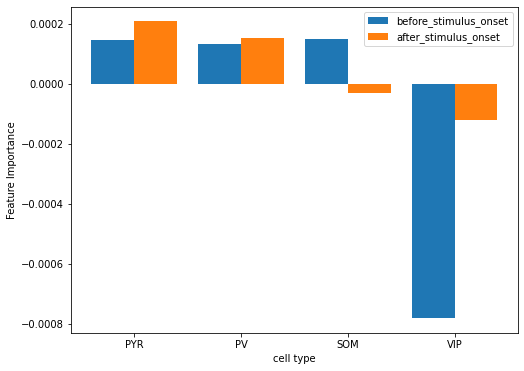

22


IndexError: ignored

In [15]:
for i,val in enumerate(y_test):
  d = {}
  if(val == 0 and i!=22):
    print(i)
    d = analysis_shap(model,i)
    plot_importance(d)

### class = 0

4
class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


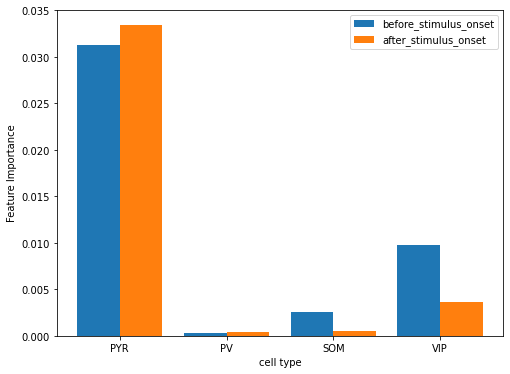

5
class = 0


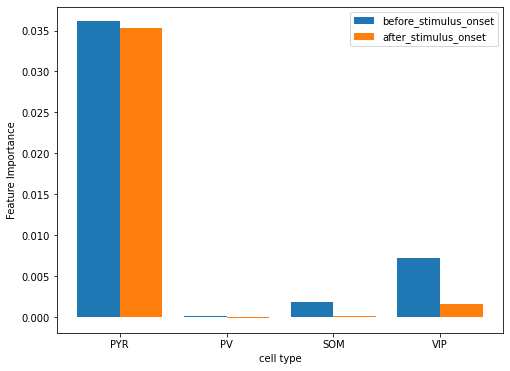

11
class = 0


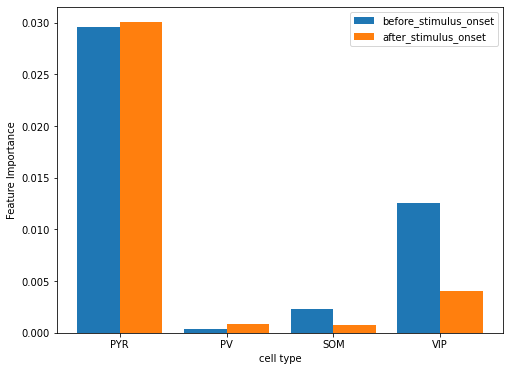

13
class = 0


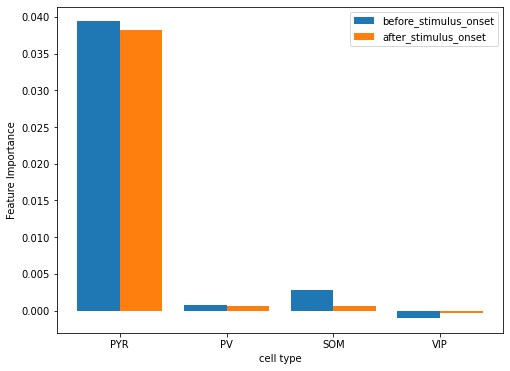

14
class = 0


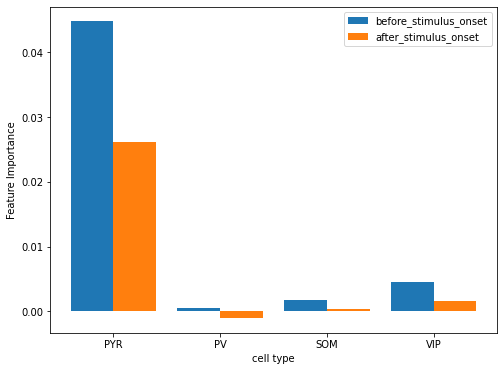

16
class = 0


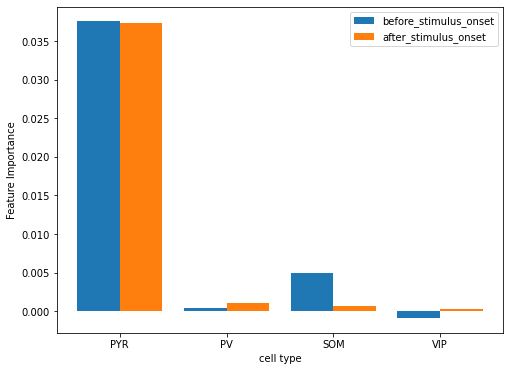

18
class = 0


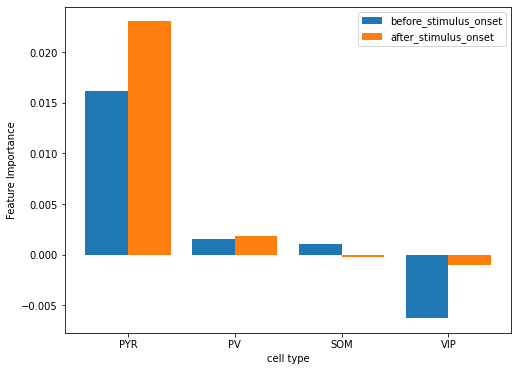

22


IndexError: ignored

In [ ]:
for i,val in enumerate(y_test):
  d = {}
  if(val == 0):
    print(i)
    d = analysis_shap(model,i)
    plot_importance(d)

### class = 1

1
class = 1


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


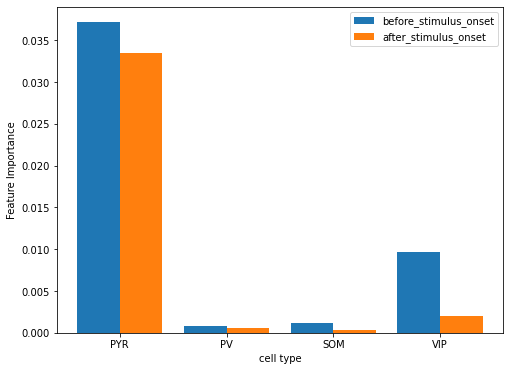

6
class = 1


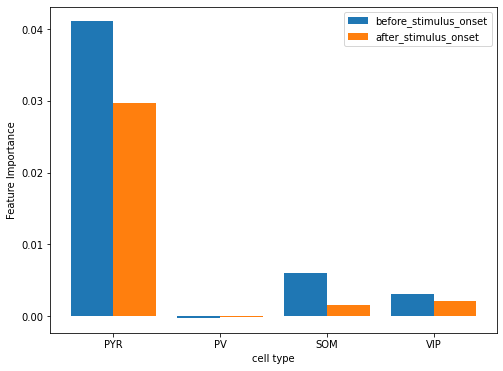

7
class = 1


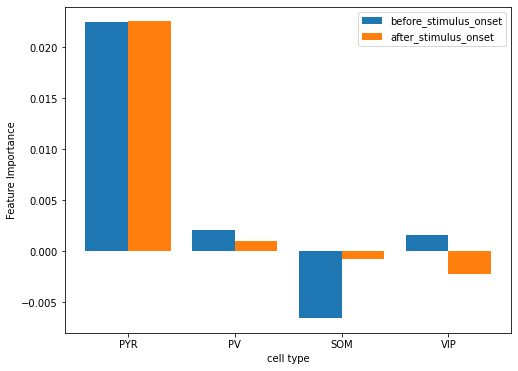

8
class = 1


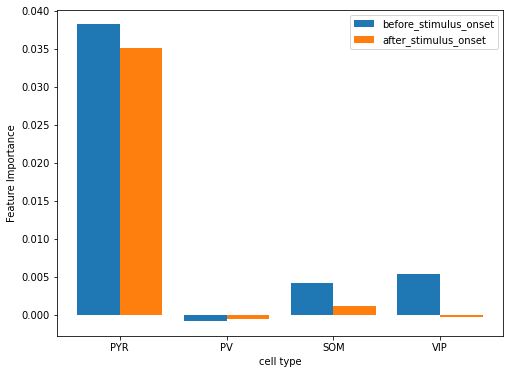

9
class = 1


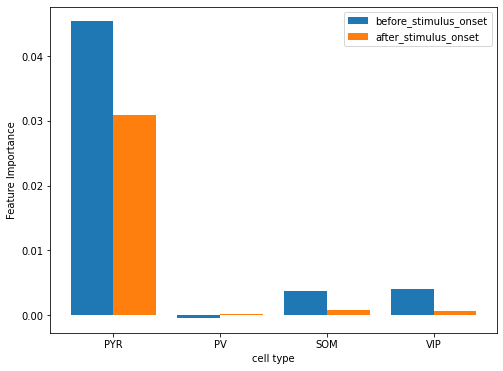

24
class = 1


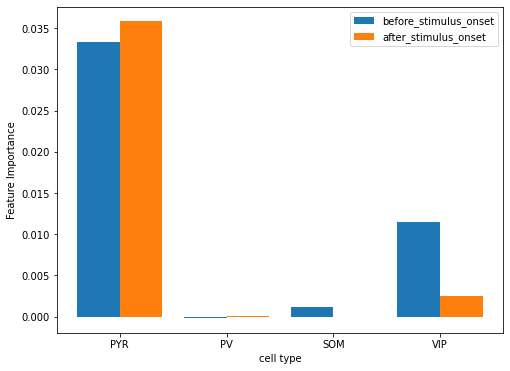

In [ ]:
for i,val in enumerate(y_test):
  d = {}
  if(val == 1):
    print(i)
    d = analysis_shap(model,i)
    plot_importance(d)

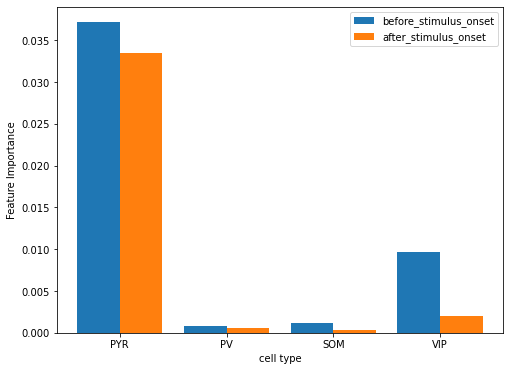

In [ ]:
plot_importance(d) #class-1

### class = 2

0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


class = 2


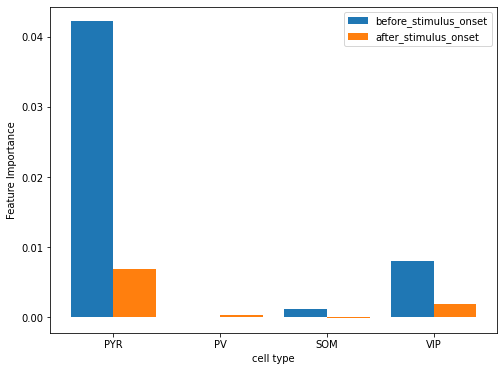

2
class = 2


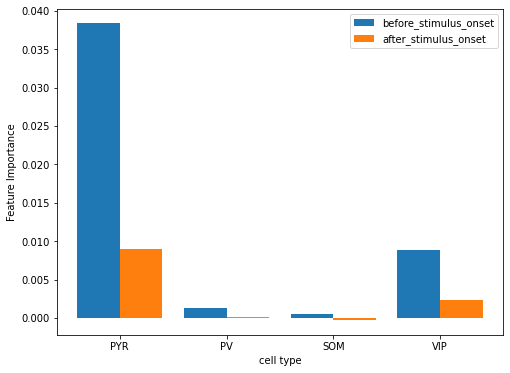

3
class = 2


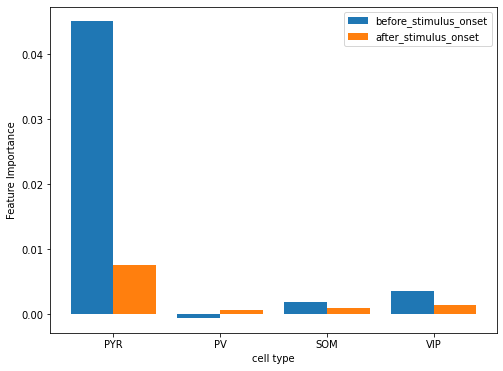

10
class = 2


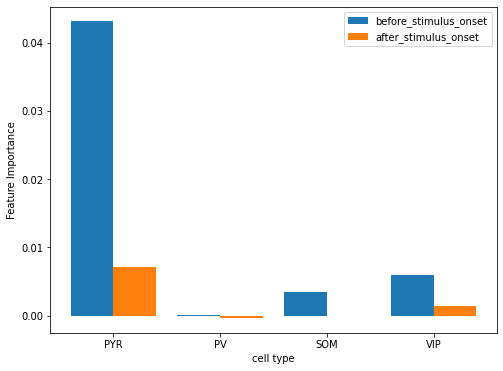

12
class = 2


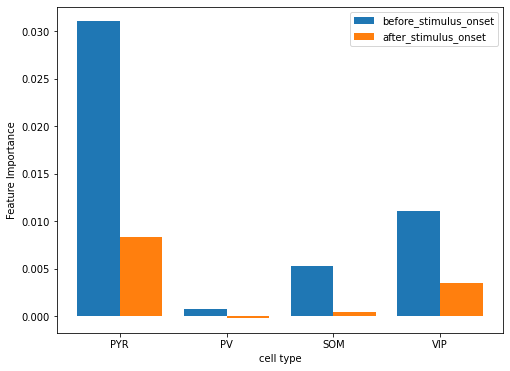

15
class = 2


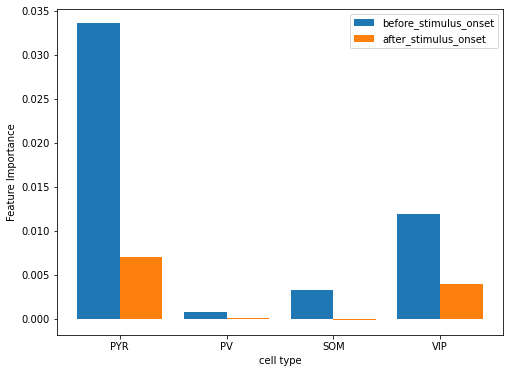

17
class = 2


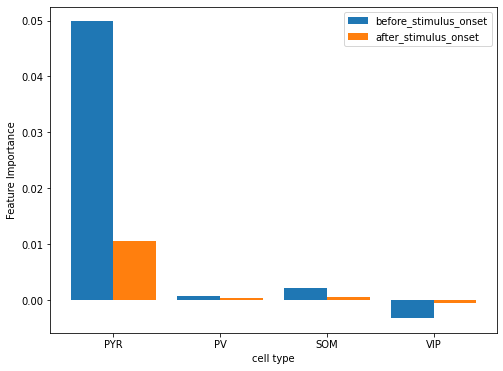

19
class = 2


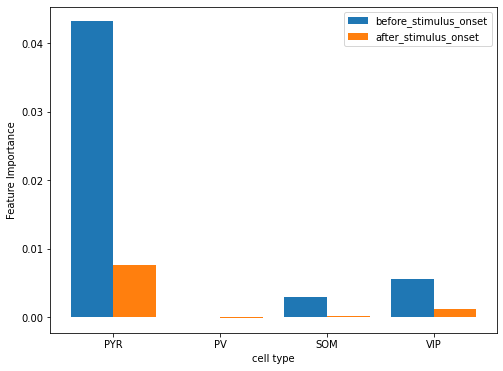

20
class = 2


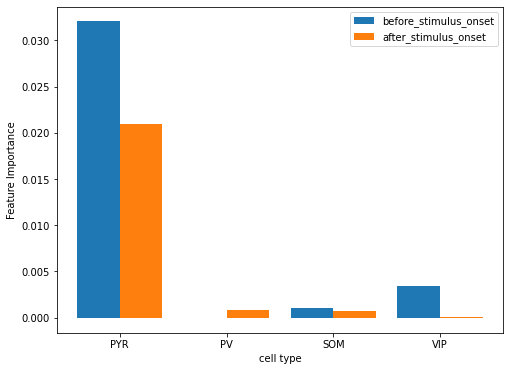

21
class = 2


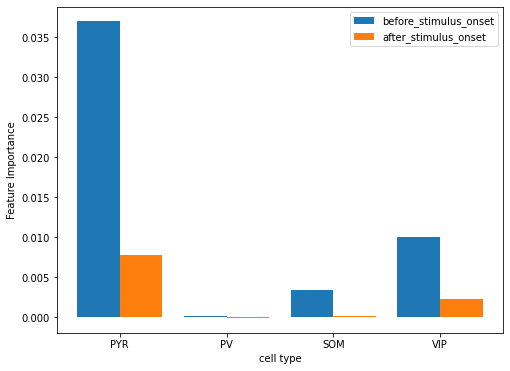

23
class = 2


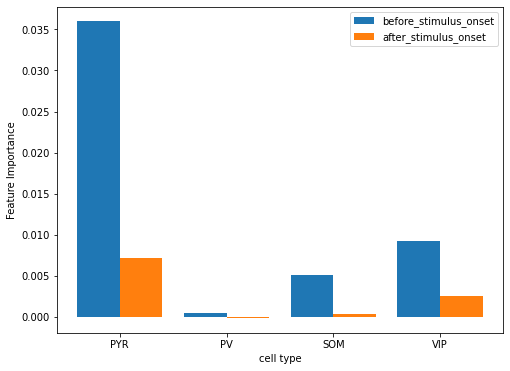

25
class = 2


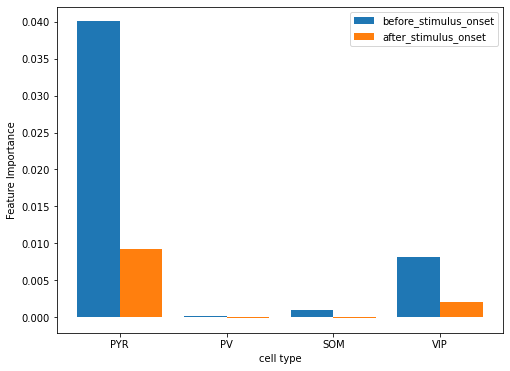

26
class = 2


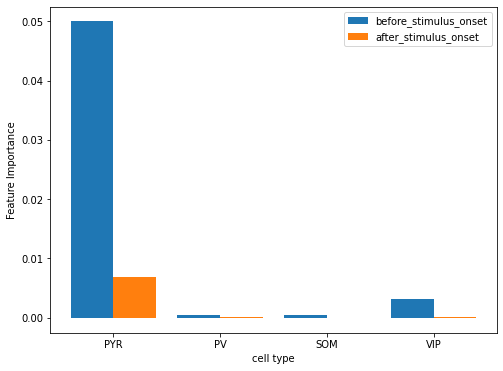

In [ ]:
for i,val in enumerate(y_test):
  d = {}
  if(val == 2):
    print(i)
    d = analysis_shap(model,i)
    plot_importance(d)

In [ ]:
d1 = analysis_shap(model,4) #class - 0

(27,) [2 1 2 2 0 0 1 1 1 1 2 0 2 0 0 2 0 2 0 2 2 2 2 2 1 2 2]
class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.03128262693686423
0.03341105465704982
0.0003438954673296024
0.00036479360836002184
0.0025557525630972577
0.0005046291485844753
0.009748495234362053
0.003641291883885363


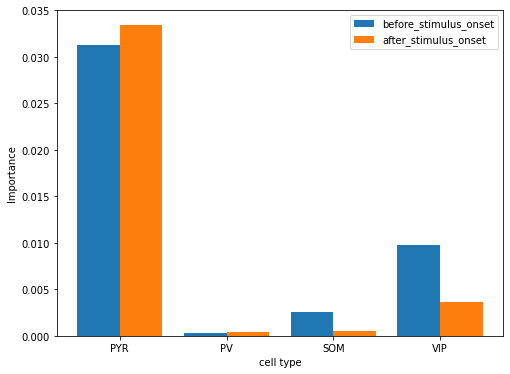

In [ ]:
plot_importance(d1)

(27,) [2 1 2 2 0 0 1 1 1 1 2 0 2 0 0 2 0 2 0 2 2 2 2 2 1 2 2]
class = 2


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.042174736256072265
0.006893276001384724
0.00012010401970030671
0.00039223708486845073
0.0012344156949900542
-7.343633456950252e-05
0.008011680617300954
0.001975196100501206


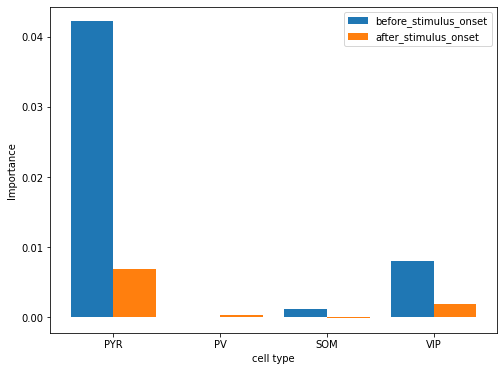

In [ ]:
d2 = analysis_shap(model,0) #class = 2
plot_importance(d2)

(27,) [2 1 2 2 0 0 1 1 1 1 2 0 2 0 0 2 0 2 0 2 2 2 2 2 1 2 2]
class = 0


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.03610969902210481
0.03533536508933426
0.00015059603411415878
-0.00010856180856282866
0.001861180181549571
0.00018069816156046018
0.007181198728858362
0.001557973952774066


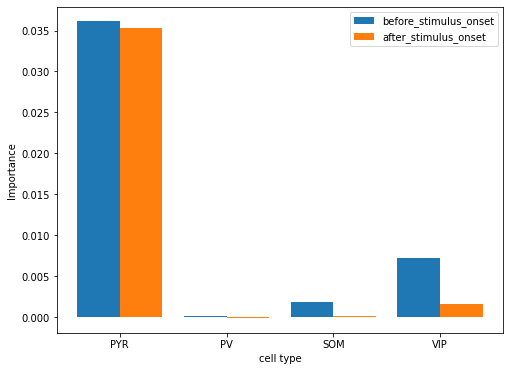

In [ ]:
d5 = analysis_shap(model,5) #class = 0
plot_importance(d5)

(27,) [2 1 2 2 0 0 1 1 1 1 2 0 2 0 0 2 0 2 0 2 2 2 2 2 1 2 2]
class = 1


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


(1, 17, 138)
(1, 8, 138)
(1, 9, 138)
(1, 138)
(1, 138)
[1 3 1 1 1 1 1 5 5 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 3 1 1 5 1 1 1 1 3 4 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 5 1 4 4 5 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 5 1 1 1 1 1
 1 1 3 3 3 1 4 4 1 1 1 1 5 1 1 1 1 3 1 1 3 3 1 1 1 3 5]
[1 3 4 5] [111  12   7   8]
0.041066071900516476
0.029750040613084002
-0.00024577465079644867
-0.00014613572300624532
0.006066897658456583
0.0014939500079991475
0.0031297322121304205
0.002117045061519699


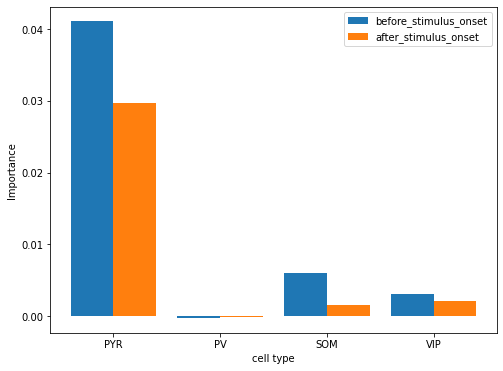

In [ ]:
d6 = analysis_shap(model,6) #class = 1
plot_importance(d6)

In [ ]:
'''   mean = np.mean(shap_values[ypred][0],axis = 0)
      m1 = np.mean(shap_values[0][0],axis = 0) #class label = 0
      m2 = np.mean(shap_values[1][0],axis = 0) #class label = 1
      m3 = np.mean(shap_values[2][0],axis = 0) #class label = 2
      #print(mean.shape)
      #shap.initjs()
      #shap.force_plot(explainer.expected_value[ypred],mean,features)
      #plt.bar(features,mean,1)
      fig,ax = plt.subplots(3,1)
      ax[0].bar(features,m1,1)
      ax[1].bar(features,m2,1)
      ax[2].bar(features,m3,1)
      for ind in [0,1,2]:
        ax[ind].title.set_text("class label = {}".format(ind))
      plt.savefig("/content/drive/MyDrive/dissertation/rat1_pre_results/bar_charts/label{}/test{}.jpg".format(ypred,i))
      plt.show()
      visualize(mean,i,ypred)
  else:
    print("ypred not equal to ylabel for test sample {}".format(i))'''

In [ ]:
def visualize(m,ii,ypred):
  plt.rcParams["figure.figsize"] = (8,6)
  ind = np.flip(np.argsort(m))
  a = data['CELLLAB_ALL'][0][0].reshape(138)
  #a = np.array([1]*111 + [3]*12 + [4]*7 + [5]*8)
  unique, counts = np.unique(a, return_counts=True)
  print(unique,counts)
  colors = []
  for i in a[ind]:
    if(i == 1):
      colors.append('r') #PYR
    elif(i == 3):
      colors.append('b') #PV
    elif(i == 4):
      colors.append('g') #SOM
    elif(i == 5):
      colors.append('y') #VIP
    else:
      colors.append('m') #others
  print("maximum contribution",ind[0:10])
  print("minimum contribution",ind[-10:])
  fig,ax = plt.subplots(1,2)
  ax[0].barh(list(map(str,ind))[-10:],m[ind][-10:],0.5,color = colors)
  ax[0].title.set_text("neurons which contribute minimum")
  ax[1].barh(list(map(str,ind))[0:10],m[ind][0:10],0.5,color = colors)
  ax[1].title.set_text("neurons that contribute maximum")
  c = {'PYR':'red', 'PV':'blue', 'SOM': 'green', 'VIP': 'yellow'}         
  labels = list(c.keys())
  handles = [plt.Rectangle((0,0),1,1, color=c[label]) for label in labels]
  ax[0].legend(handles, labels)
  ax[1].legend(handles,labels)
  plt.savefig("/content/drive/MyDrive/dissertation/rat1_pre_results/color_charts/label{}/test{}.jpg".format(ypred,ii))
  plt.show()

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
keras is no longer supported, please use tf.keras instead.
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


model output [[0.01423127 0.00276895 0.98299974]] 2

shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


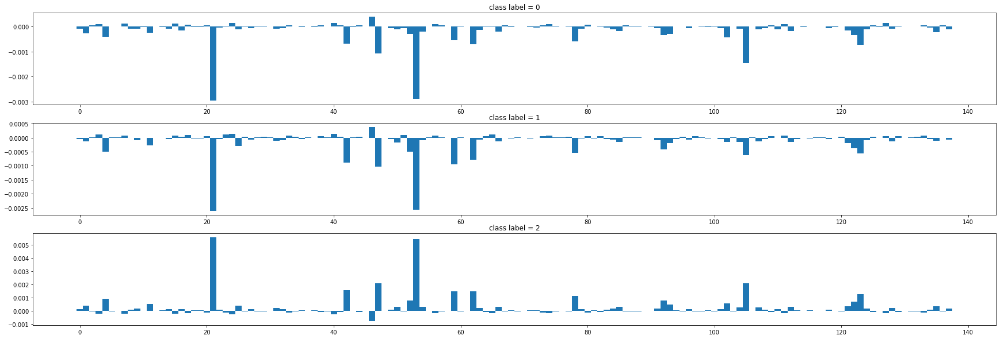

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53  47 105  42  59  62 123  78   4]
minimum contribution [ 17  56 111 127   7  15   3  40  24  46]


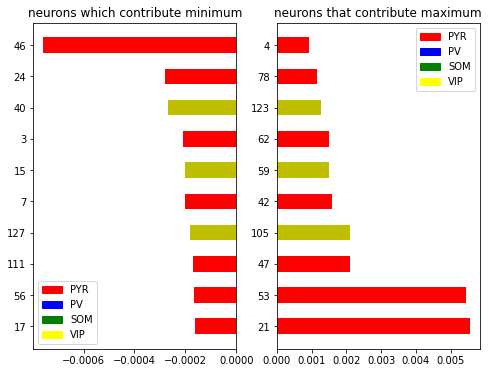

model output [[0.04580809 0.9510926  0.00309929]] 1
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 1


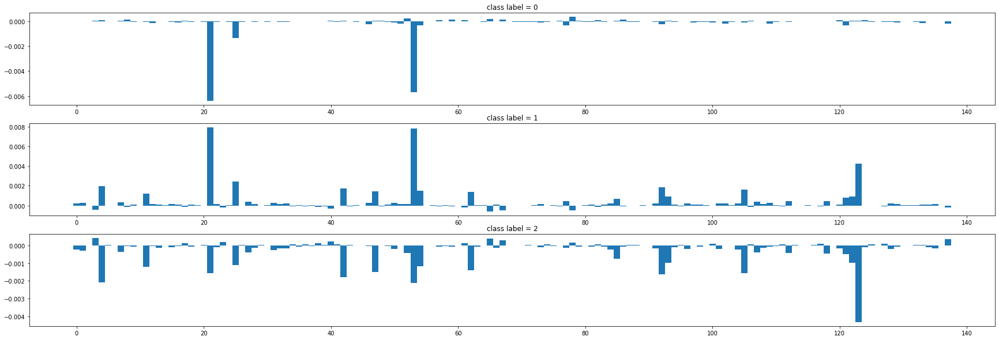

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53 123  25   4  92  42 105  54  47]
minimum contribution [ 82  17 137  61  23  40   3  67  78  65]


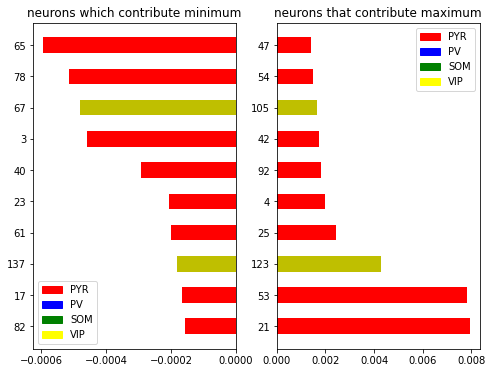

model output [[0.0140124  0.00302822 0.9829594 ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


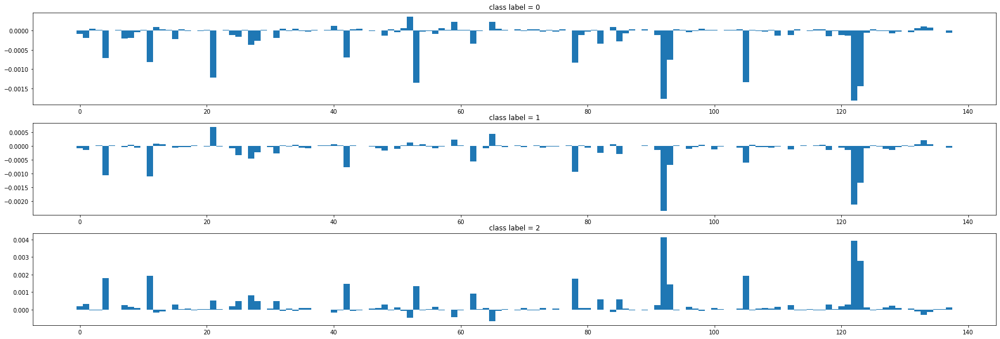

[1 3 4 5] [111  12   7   8]
maximum contribution [ 92 122 123 105  11   4  78  42  93  53]
minimum contribution [ 13 132 134  84  40  12 133  59  52  65]


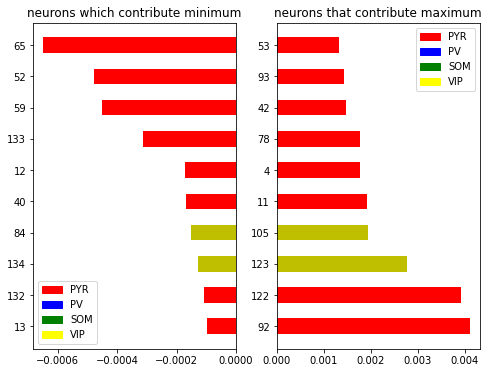

model output [[0.01342685 0.00294384 0.9836293 ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


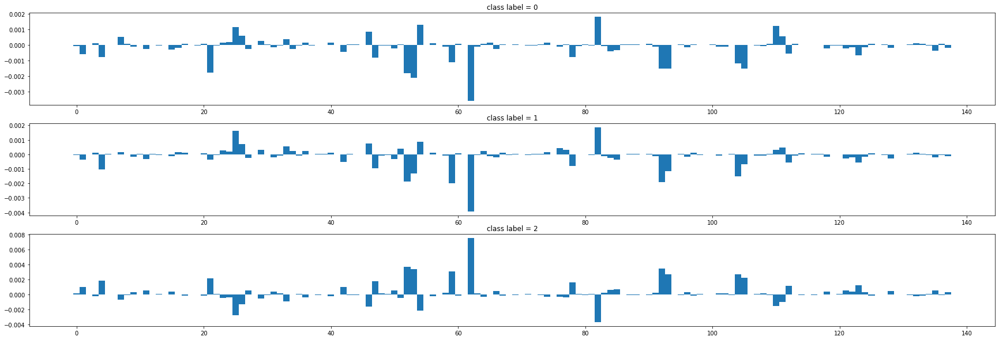

[1 3 4 5] [111  12   7   8]
maximum contribution [ 62  52  92  53  59 104  93 105  21   4]
minimum contribution [ 29   7  33 111  26 110  46  54  25  82]


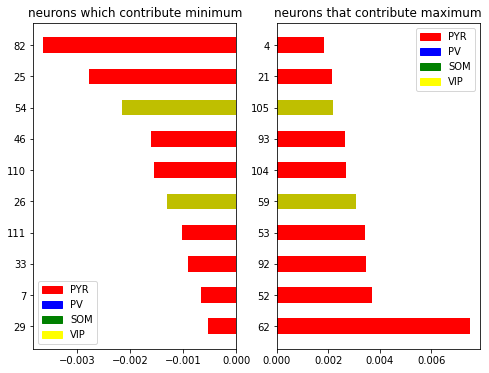

model output [[0.97216034 0.01358606 0.01425356]] 0
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 0


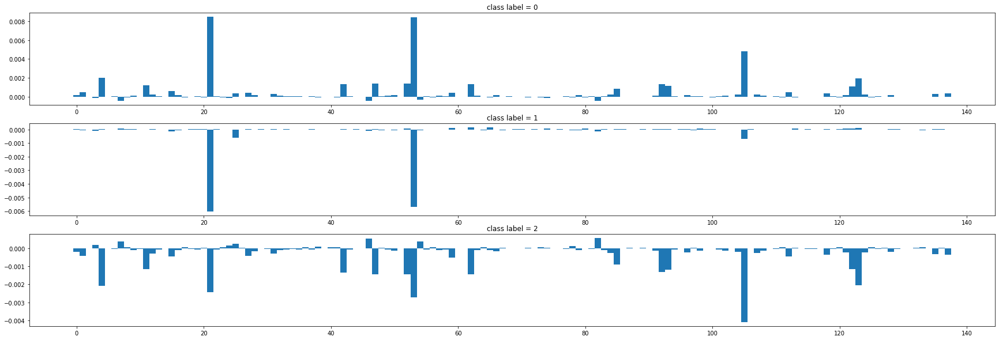

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53 105   4 123  47  52  42  92  62]
minimum contribution [113  78   8   3  74  24  54  46   7  82]


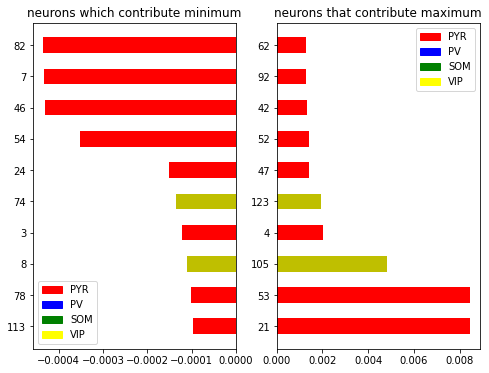

model output [[0.97452897 0.01063725 0.01483377]] 0
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 0


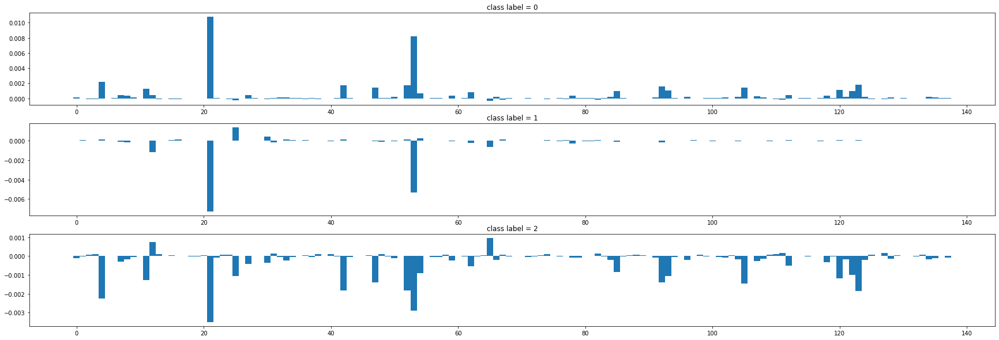

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53   4 123  52  42  92  47 105  11]
minimum contribution [ 13  15  74 110 127  82 111  67  25  65]


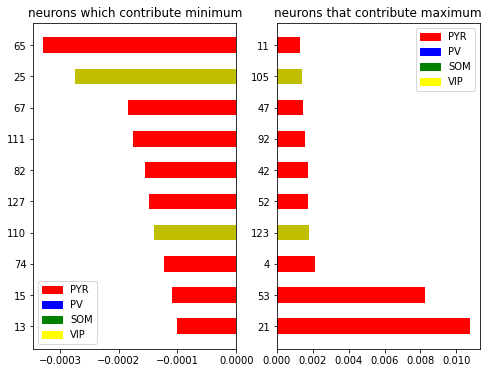

model output [[0.06359767 0.93166435 0.00473789]] 1
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 1


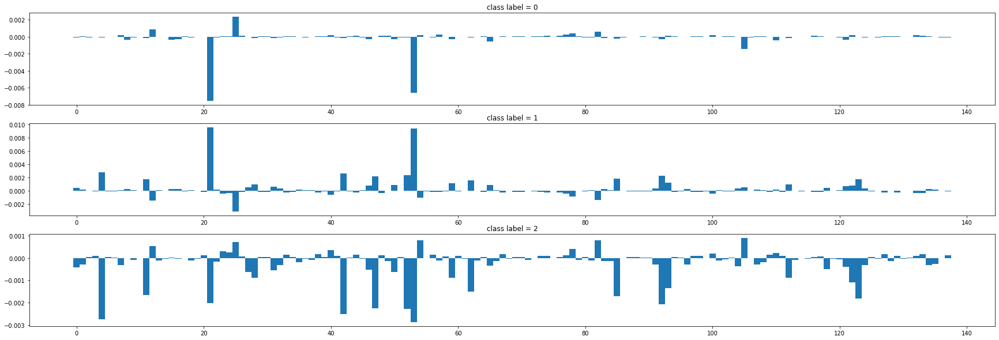

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53   4  42  52  92  47  85 123  11]
minimum contribution [133  23 100  77  40  78  54  82  12  25]


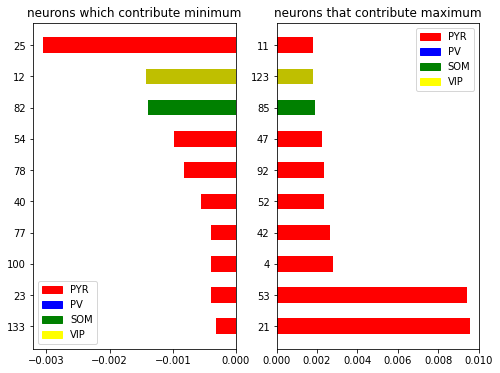

model output [[0.41526702 0.57308704 0.01164601]] 1
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 1


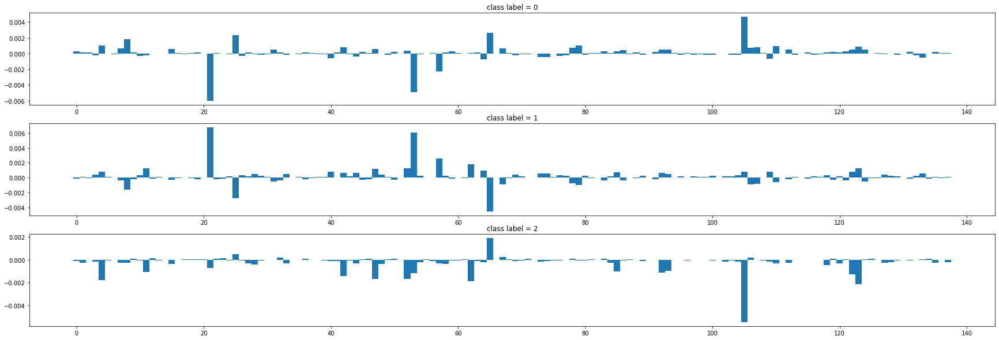

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53  57  62  52  11 123  47  64 109]
minimum contribution [124 110  78 107  67 106  79   8  25  65]


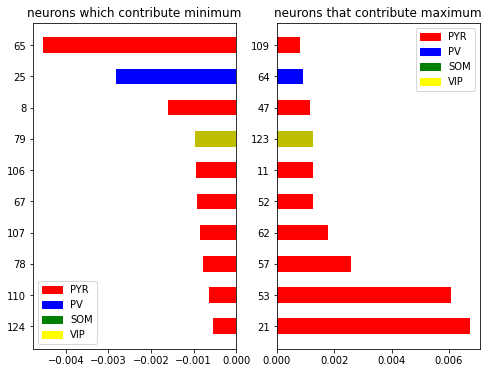

model output [[0.06898528 0.92721367 0.00380097]] 1
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 1


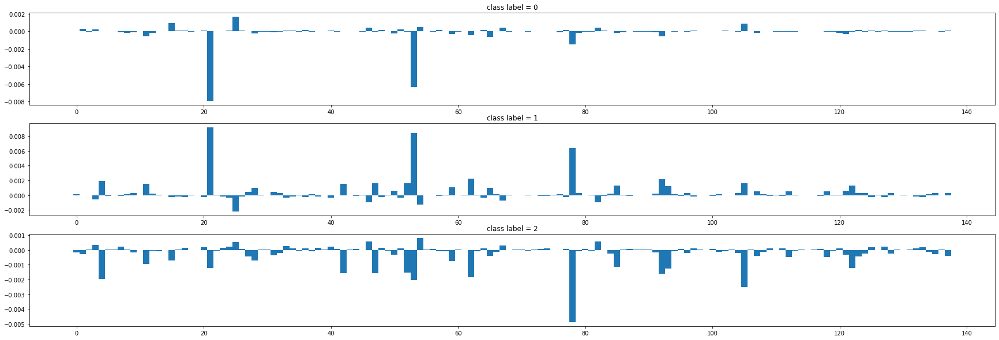

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53  78  62  92   4  52 105  47  42]
minimum contribution [24 40 33 51  3 67 82 46 54 25]


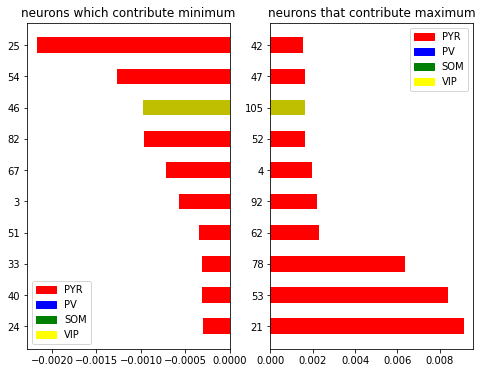

model output [[0.04728871 0.94801337 0.00469786]] 1
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 1


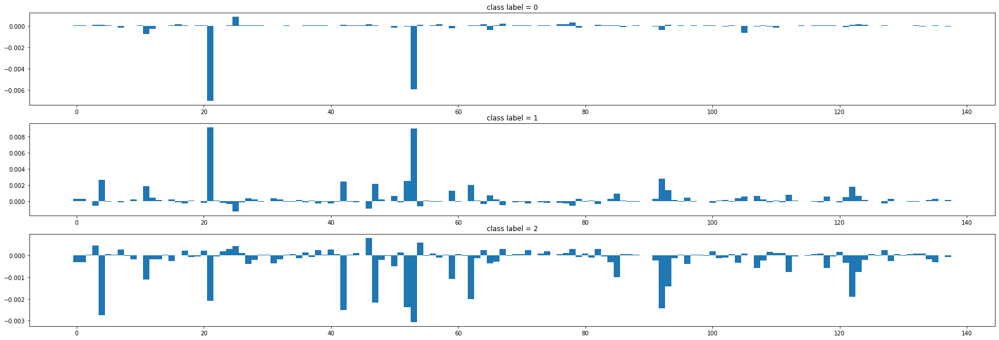

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53  92   4  52  42  47  62  11 122]
minimum contribution [38 24 64 82 67  3 78 54 46 25]


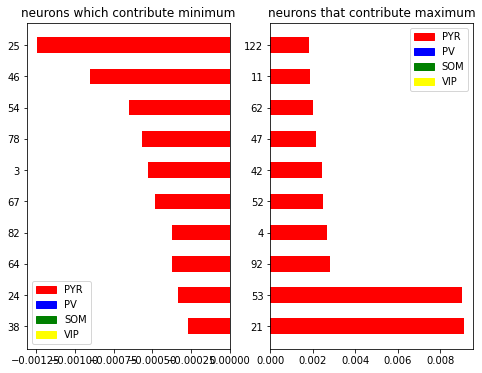

model output [[0.01393542 0.00288554 0.983179  ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


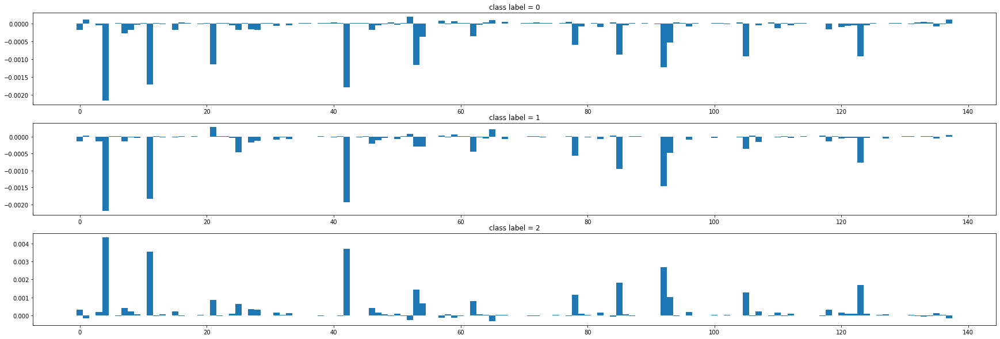

[1 3 4 5] [111  12   7   8]
maximum contribution [  4  42  11  92  85 123  53 105  78  93]
minimum contribution [134  77  84 133  57  59   1 137  52  65]


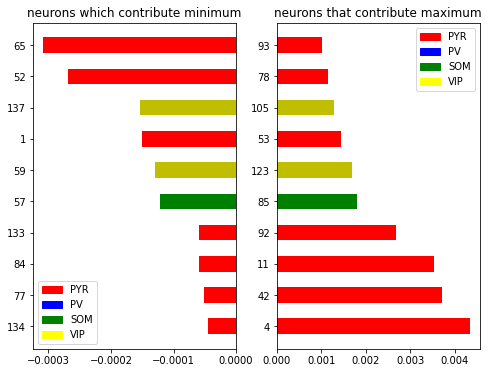

model output [[0.95887995 0.02600639 0.01511364]] 0
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 0


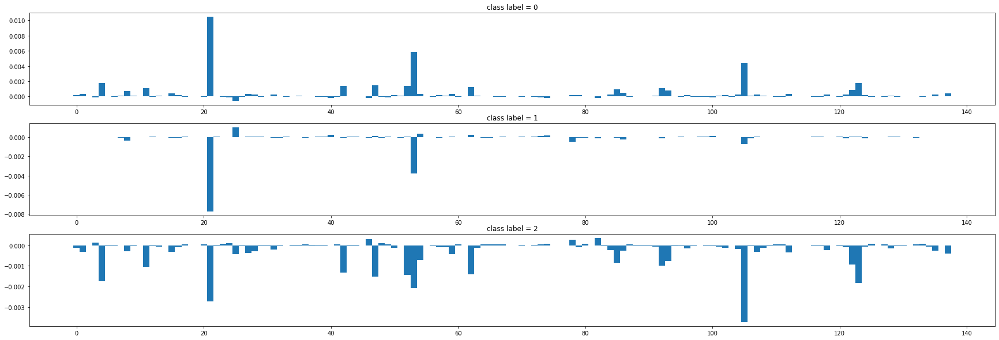

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53 105 123   4  47  52  42  62  92]
minimum contribution [ 24   3 100  73  49  40  46  74  82  25]


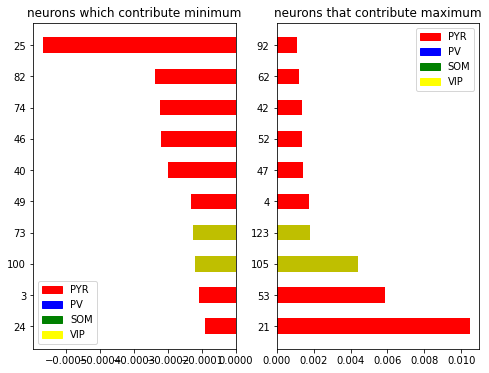

model output [[0.01403694 0.00291986 0.98304313]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


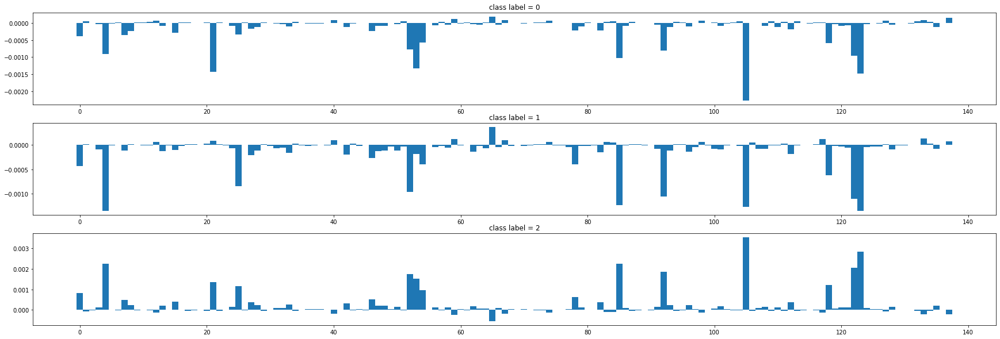

[1 3 4 5] [111  12   7   8]
maximum contribution [105 123  85   4 122  92  52  53  21 118]
minimum contribution [ 98  12 117  74  40  67 137 133  59  65]


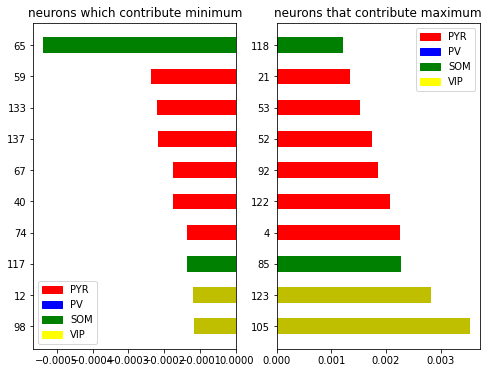

model output [[0.9660741  0.01725252 0.01667337]] 0
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 0


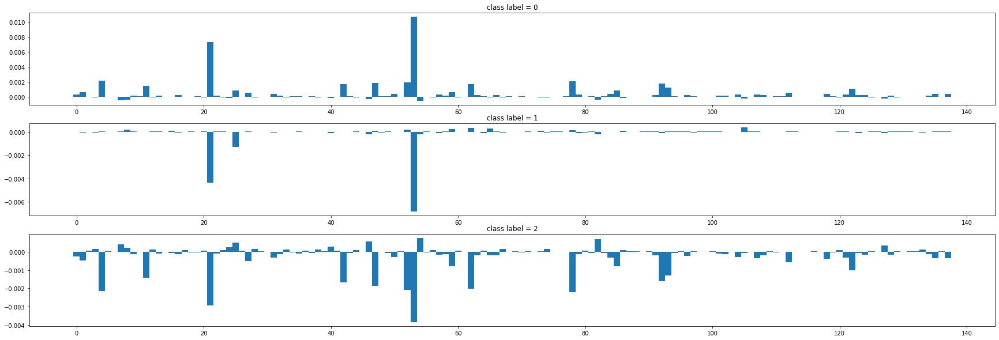

[1 3 4 5] [111  12   7   8]
maximum contribution [53 21  4 78 52 47 92 62 42 11]
minimum contribution [ 86  40  24 127 105  46   8  82   7  54]


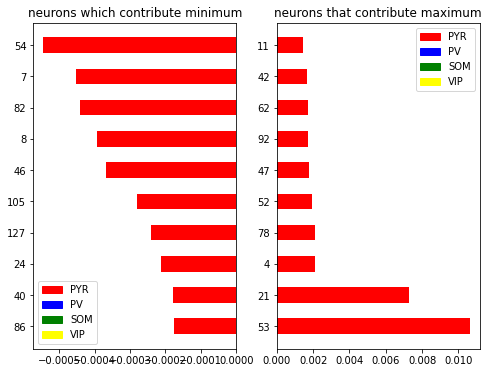

model output [[0.9358164  0.04322007 0.02096348]] 0
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 0


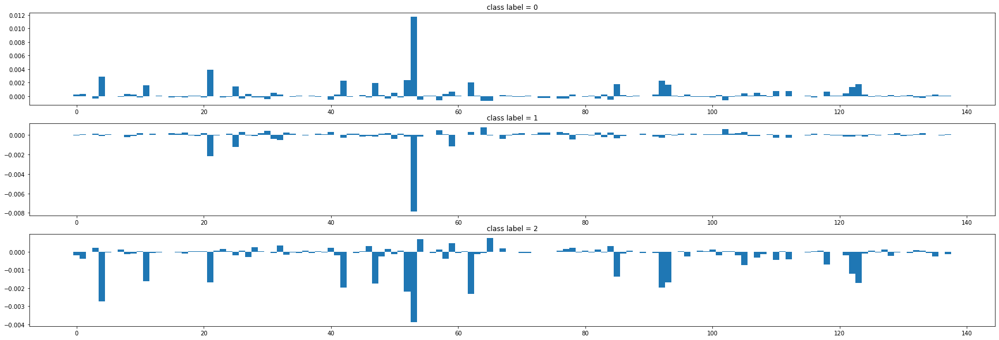

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21   4  52  42  92  62  47 123  85]
minimum contribution [ 76  82  30  40  54  84 102  57  65  64]


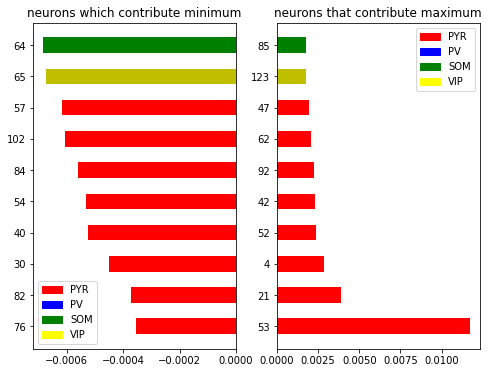

model output [[0.01401658 0.00299509 0.9829883 ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


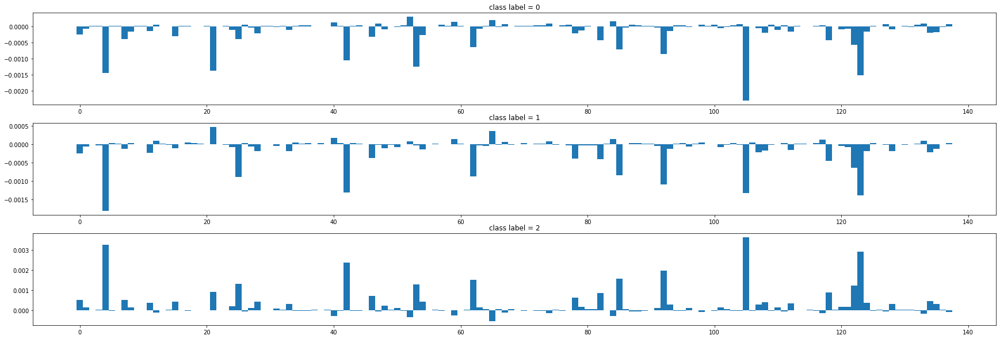

[1 3 4 5] [111  12   7   8]
maximum contribution [105   4 123  42  92  85  62  25  53 122]
minimum contribution [ 67  12 117  74 133  59  84  40  52  65]


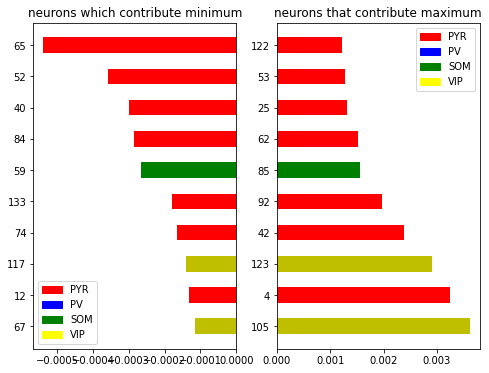

model output [[0.96980953 0.01324078 0.0169497 ]] 0
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 0


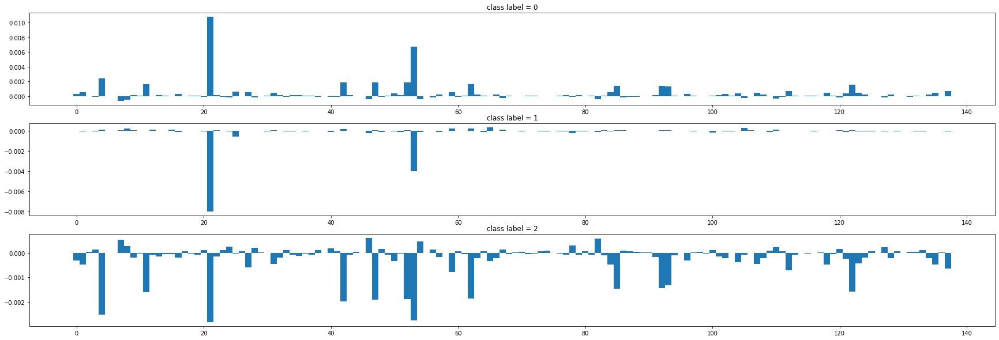

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53   4  52  47  42  62  11 122  85]
minimum contribution [ 24  28 105  67 110  54  46  82   8   7]


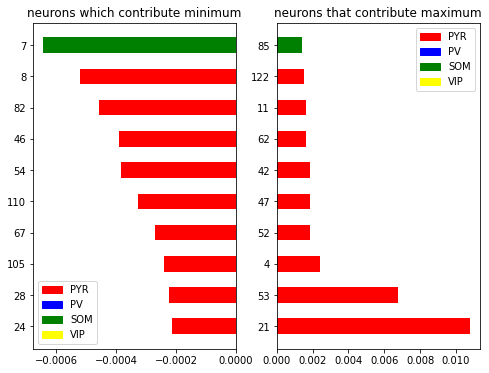

model output [[0.0138643  0.00282252 0.98331314]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


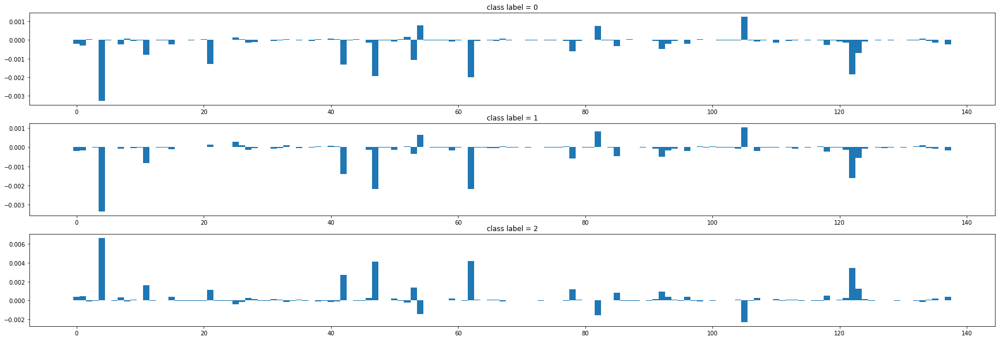

[1 3 4 5] [111  12   7   8]
maximum contribution [  4  62  47 122  42  11  53 123  78  21]
minimum contribution [ 67  40  33  26 133  52  25  54  82 105]


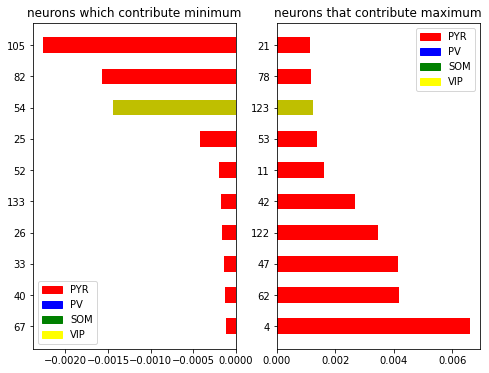

model output [[0.59242815 0.3884968  0.01907503]] 0
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 0


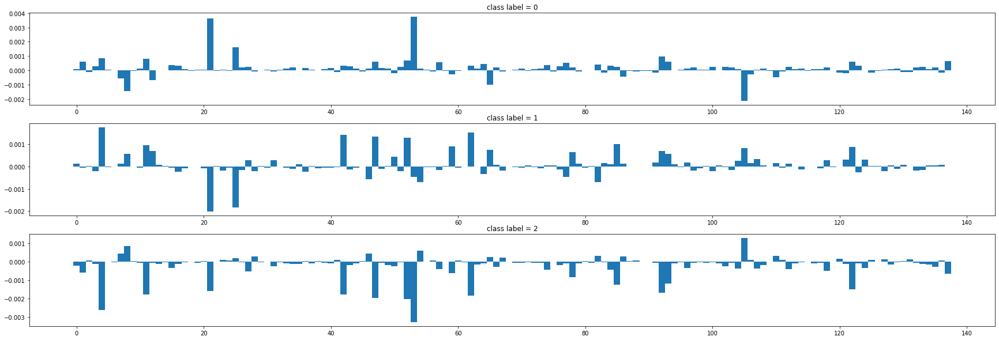

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53  21  25  92   4  11  52 137   1  93]
minimum contribution [121 106  59  86 110   7  12  65   8 105]


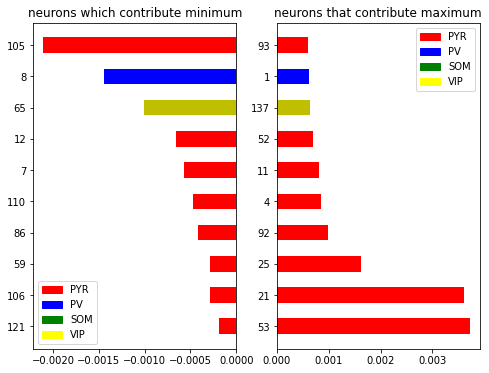

model output [[0.01411758 0.00281045 0.9830719 ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


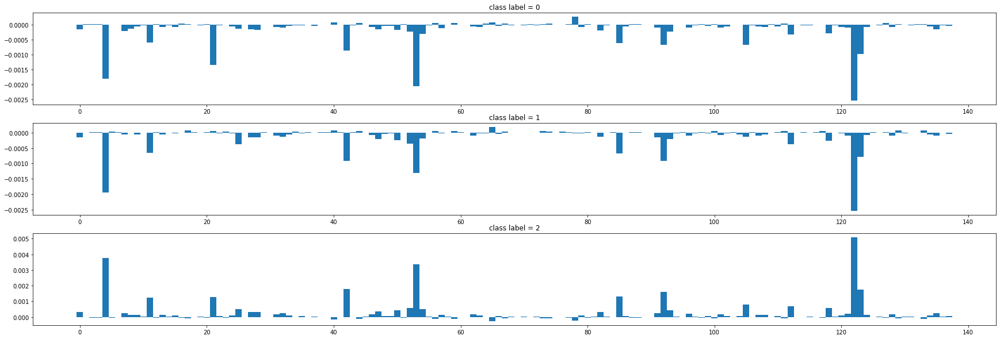

[1 3 4 5] [111  12   7   8]
maximum contribution [122   4  53  42 123  92  85  21  11 105]
minimum contribution [129  17 111  59 133  44  56  40  78  65]


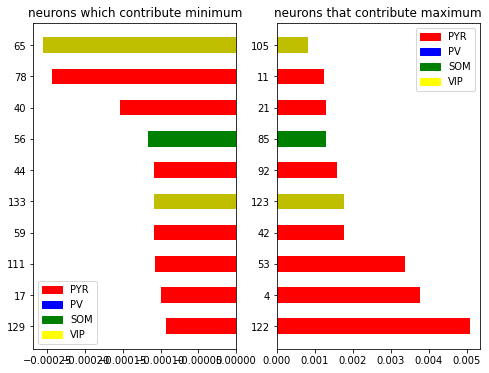

model output [[0.01415817 0.00262861 0.9832132 ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


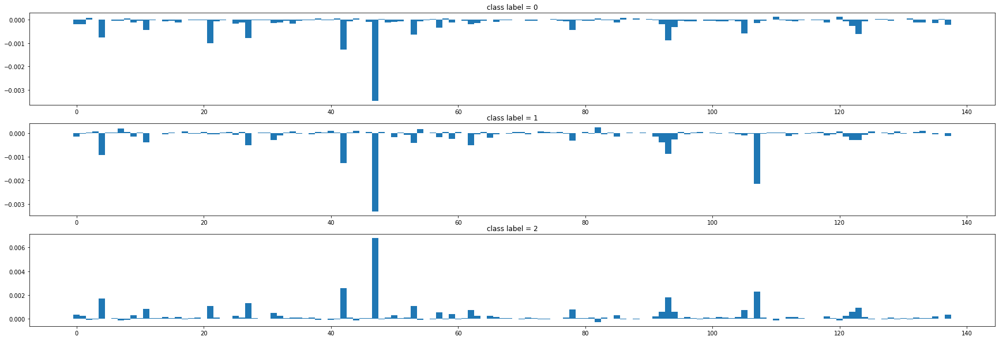

[1 3 4 5] [111  12   7   8]
maximum contribution [ 47  42 107  93   4  27  53  21 123  11]
minimum contribution [ 40   2   8  38  54 110   7  44 120  82]


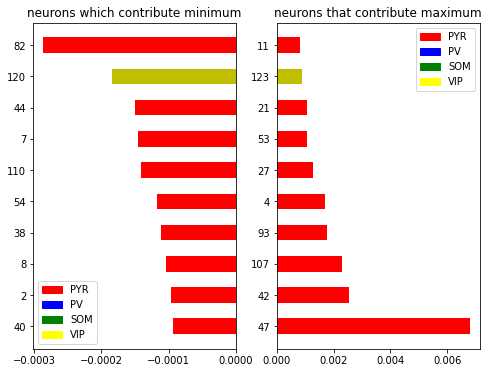

model output [[0.01401884 0.00288619 0.983095  ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


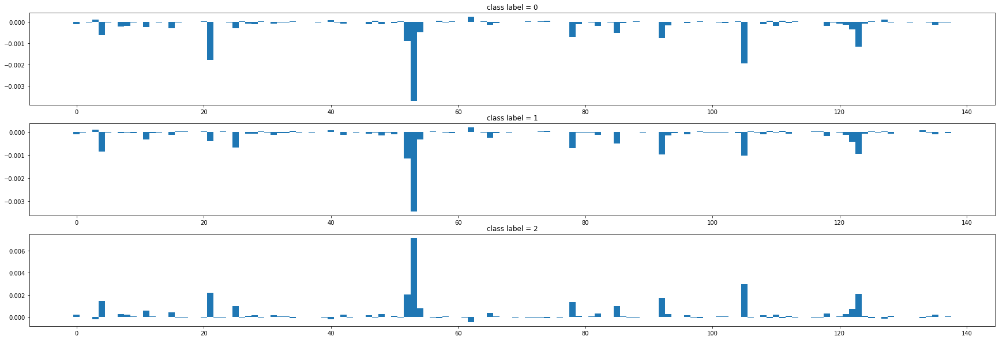

[1 3 4 5] [111  12   7   8]
maximum contribution [ 53 105  21 123  52  92   4  78  85  25]
minimum contribution [133  34 125 111  74 109 127  40   3  62]


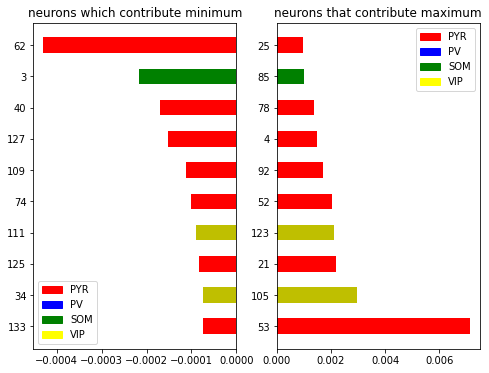

model output [[0.02803164 0.00205771 0.9699107 ]] 0
ypred not equal to ylabel for test sample 22
model output [[0.01412866 0.00290805 0.9829633 ]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


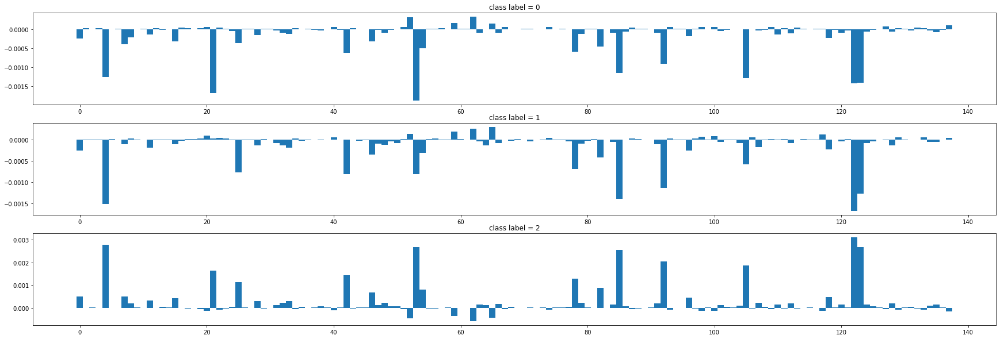

[1 3 4 5] [111  12   7   8]
maximum contribution [122   4  53 123  85  92 105  21  42  78]
minimum contribution [ 40  98 100 117  20 137  59  65  52  62]


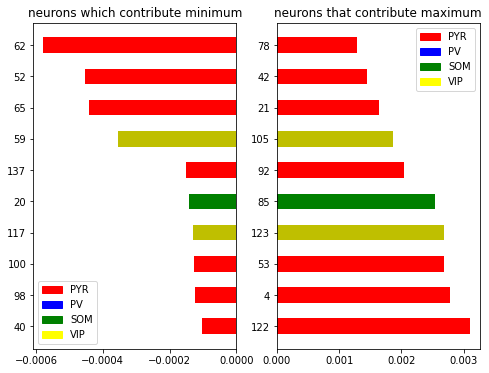

model output [[0.05329603 0.9438889  0.00281507]] 1
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 1


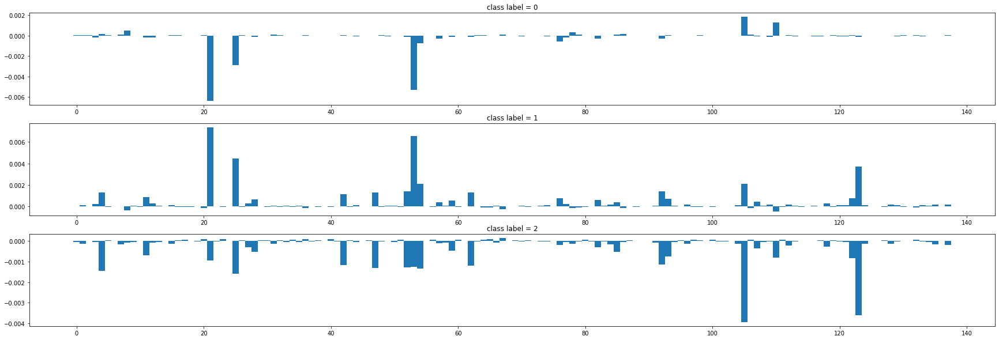

[1 3 4 5] [111  12   7   8]
maximum contribution [ 21  53  25 123 105  54  52  92  62   4]
minimum contribution [ 65  64  86 106  20  36  78  67   8 110]


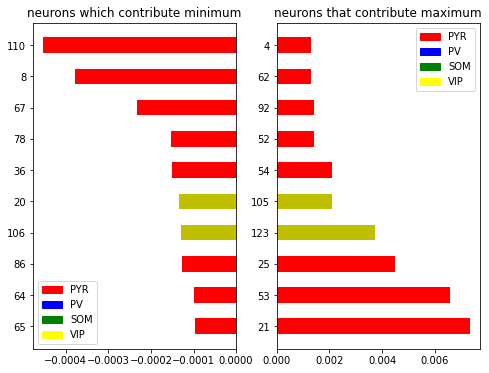

model output [[0.01382777 0.00290271 0.98326945]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


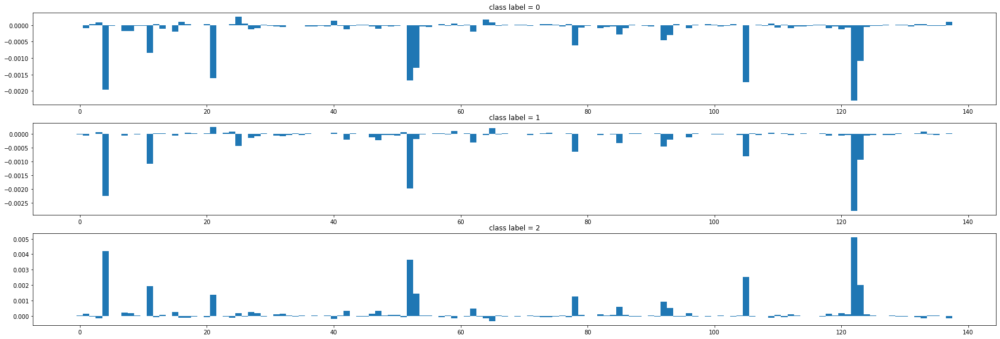

[1 3 4 5] [111  12   7   8]
maximum contribution [122   4  52 105 123  11  53  21  78  92]
minimum contribution [109  16  24 133 137  64   3  59  40  65]


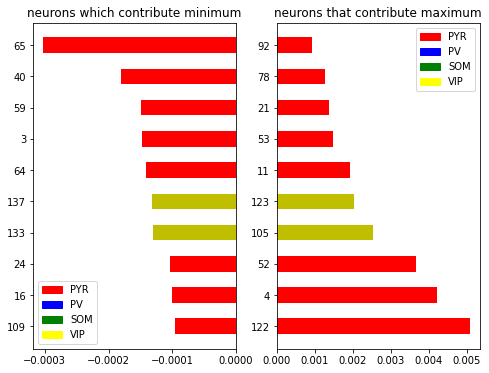

model output [[0.0141148  0.00276038 0.98312485]] 2
shap output [0.2794182  0.23259489 0.48798674]
predicted class = 2


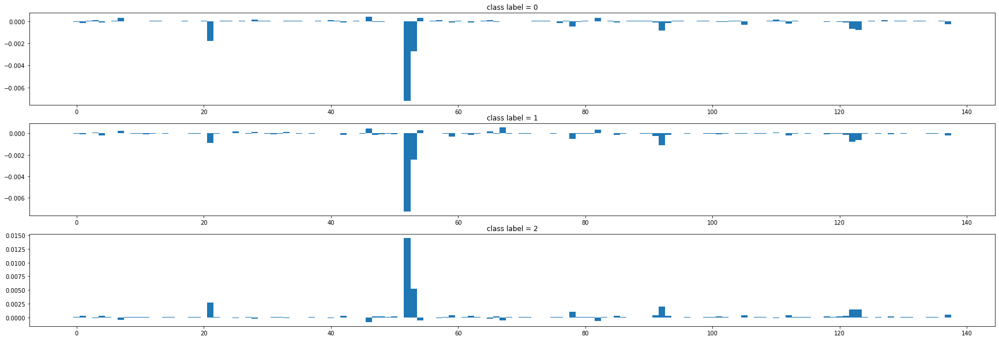

[1 3 4 5] [111  12   7   8]
maximum contribution [ 52  53  21  92 122 123  78 137  59 112]
minimum contribution [ 33  25 110  65  28   7  67  54  82  46]


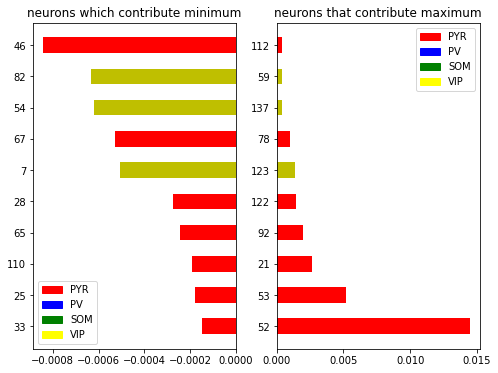

In [ ]:
for i in range(len(y_test)):
  analysis_shap(i,model)

In [ ]:
def analysis_shap(i,model):
  b = X_test[i].reshape(1,17,138)
  print("model output",model.predict(b),y_test[i])
  ypred = np.argmax(model.predict(b)) #index of label with max prob
  features = list(range(0,138))
  if(ypred == y_test[i]):
    explainer = shap.DeepExplainer(model,X_trn)
    print("shap output",explainer.expected_value)
    shap_values = explainer.shap_values(b)
    mean = np.mean(shap_values[ypred][0],axis = 0)
    shap.initjs()
    shap.force_plot(explainer.expected_value[ypred],mean,features)
    plt.bar(features,mean,1)
    plt.savefig("/content/drive/MyDrive/dissertation/rat1_results/bar_charts/test{}.jpg".format(i))
    plt.show()
    visualize(mean,i)
  else:
    print("ypred not equal to ylabel")

In [ ]:
def visualize(m,ii):
  ind = np.argsort(m)
  a = data['CELLLAB_ALL'][0][0].reshape(138)
  #a = np.array([1]*111 + [3]*12 + [4]*7 + [5]*8)
  unique, counts = np.unique(a, return_counts=True)
  print(unique,counts)
  colors = []
  for i in a[ind]:
    if(i == 1):
      colors.append('r') #PYR
    elif(i == 3):
      colors.append('b') #PV
    elif(i == 4):
      colors.append('g') #SOM
    elif(i == 5):
      colors.append('y') #VIP
    else:
      colors.append('m') #others
  plt.bar(list(map(str,ind)),m[ind],1,color = colors)
  plt.savefig("/content/drive/MyDrive/dissertation/rat1_results/color_chart/test{}.jpg".format(ii))
  plt.show()

In [ ]:
def analysis_shap(i,model):
  plt.rcParams["figure.figsize"] = (30,10)
  b = X_test[i].reshape(1,17,138)
  print("model output",model.predict(b),y_test[i])
  ypred = np.argmax(model.predict(b)) #index of label with max prob
  features = list(range(0,138))
  if(ypred == y_test[i]):
    explainer = shap.DeepExplainer(model,X_trn)
    print("shap output",explainer.expected_value)
    print("predicted class = {}".format(ypred))
    shap_values = explainer.shap_values(b)
    mean = np.mean(shap_values[ypred][0],axis = 0)
    m1 = np.mean(shap_values[0][0],axis = 0) #class label = 0
    m2 = np.mean(shap_values[1][0],axis = 0) #class label = 1
    m3 = np.mean(shap_values[2][0],axis = 0) #class label = 2
    #print(mean.shape)
    #shap.initjs()
    #shap.force_plot(explainer.expected_value[ypred],mean,features)
    #plt.bar(features,mean,1)
    fig,ax = plt.subplots(3,1)
    ax[0].bar(features,m1,1)
    ax[1].bar(features,m2,1)
    ax[2].bar(features,m3,1)
    for i in [0,1,2]:
      ax[i].title.set_text("class label = {}".format(i))
    #plt.savefig("/content/drive/MyDrive/dissertation/rat1_post_results/bar_charts/test{}.jpg".format(i))
    plt.show()
    visualize(mean,i)
  else:
    print("ypred not equal to ylabel")

In [ ]:
def visualize(m,ii):
  plt.rcParams["figure.figsize"] = (8,6)
  ind = np.flip(np.argsort(m))
  a = data['CELLLAB_ALL'][0][0].reshape(138)
  #a = np.array([1]*111 + [3]*12 + [4]*7 + [5]*8)
  unique, counts = np.unique(a, return_counts=True)
  print(unique,counts)
  colors = []
  for i in a[ind]:
    if(i == 1):
      colors.append('r') #PYR
    elif(i == 3):
      colors.append('b') #PV
    elif(i == 4):
      colors.append('g') #SOM
    elif(i == 5):
      colors.append('y') #VIP
    else:
      colors.append('m') #others
  print("maximum contribution",ind[0:10])
  print("minimum contribution",ind[-10:])
  fig,ax = plt.subplots(1,2)
  ax[0].barh(list(map(str,ind))[-10:],m[ind][-10:],0.5,color = colors)
  ax[0].title.set_text("neurons which contribute minimum")
  ax[1].barh(list(map(str,ind))[0:10],m[ind][0:10],0.5,color = colors)
  ax[1].title.set_text("neurons that contribute maximum")
  c = {'PYR':'red', 'PV':'blue', 'SOM': 'green', 'VIP': 'yellow'}         
  labels = list(c.keys())
  handles = [plt.Rectangle((0,0),1,1, color=c[label]) for label in labels]
  ax[0].legend(handles, labels)
  ax[1].legend(handles,labels)
  #plt.savefig("/content/drive/MyDrive/dissertation/rat1_post_results/color_chart/test{}.jpg".format(ii))
  plt.show()

#label = 0

model output [[0.97216034 0.01358606 0.01425356]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


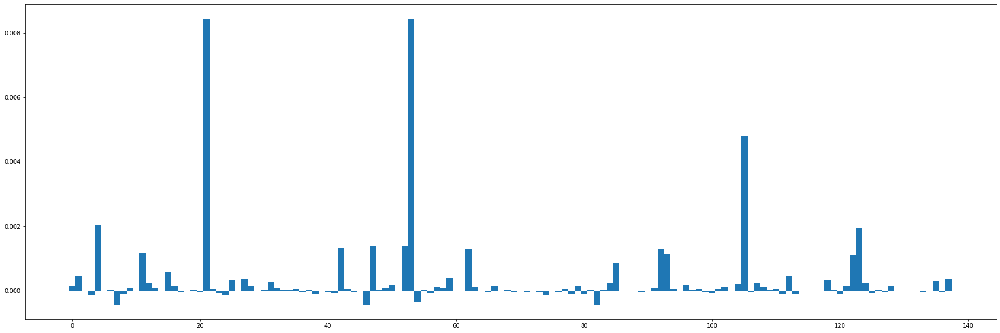

[1 3 4 5] [111  12   7   8]


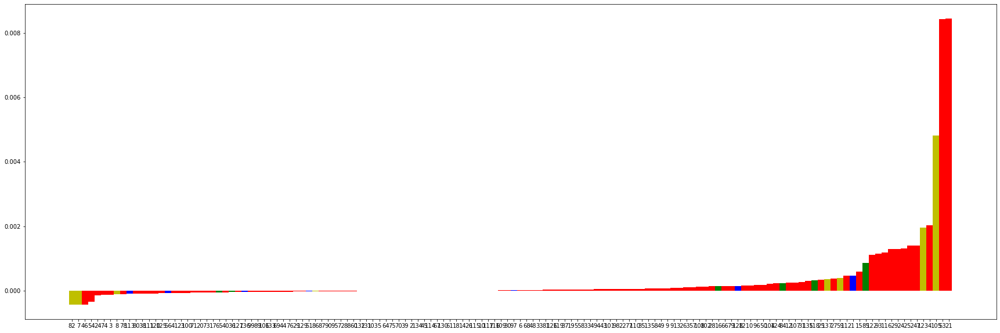

In [ ]:
analysis_shap(4,model)

model output [[0.97452897 0.01063725 0.01483377]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


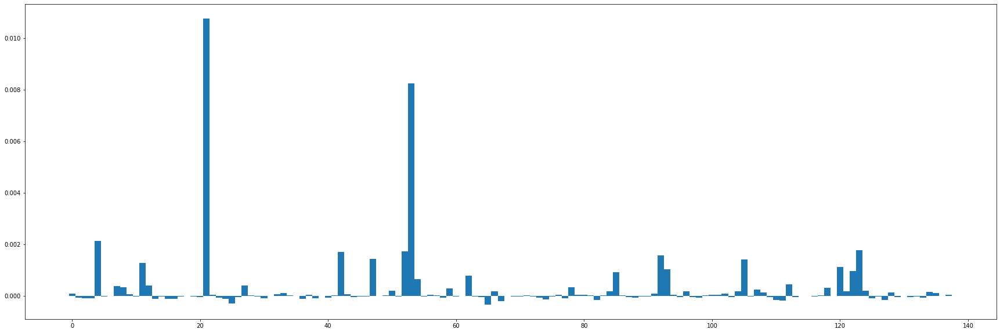

[1 3 4 5] [111  12   7   8]


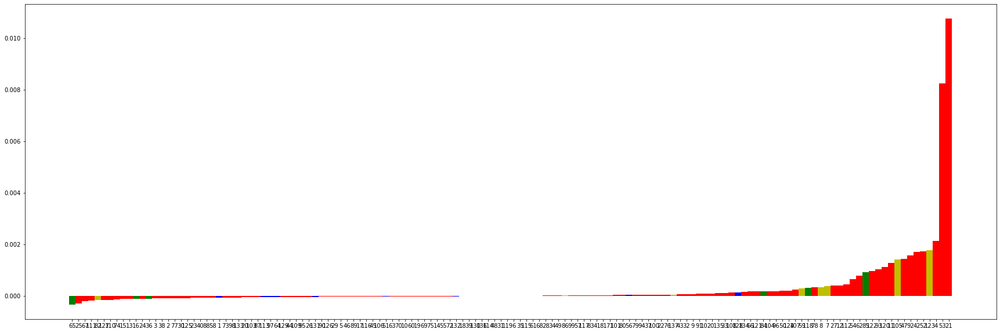

In [ ]:
analysis_shap(5,model)

model output [[0.95887995 0.02600639 0.01511364]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


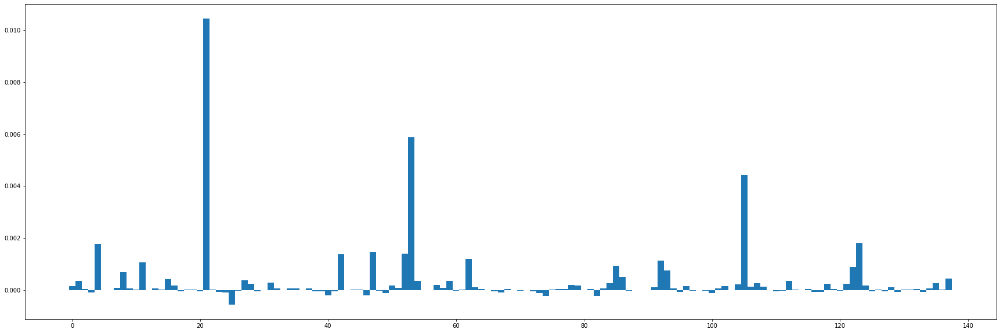

[1 3 4 5] [111  12   7   8]


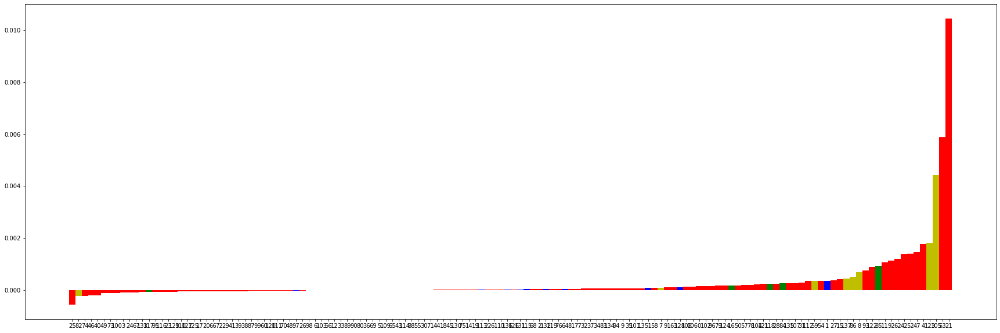

In [ ]:
analysis_shap(11,model)

model output [[0.9660741  0.01725252 0.01667337]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


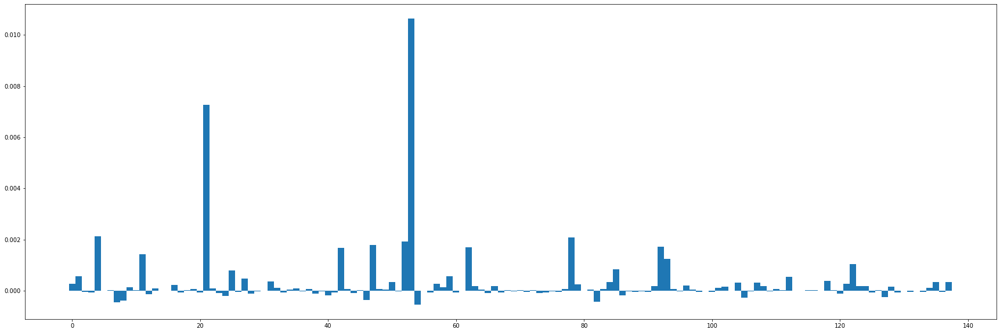

[1 3 4 5] [111  12   7   8]


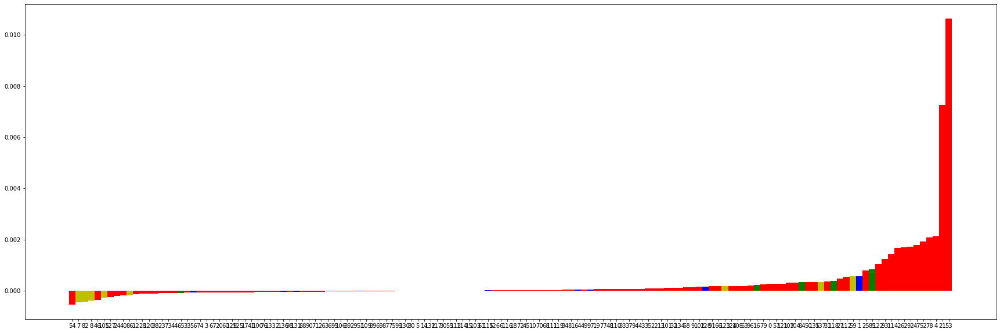

In [ ]:
analysis_shap(13,model)

model output [[0.9358164  0.04322007 0.02096348]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


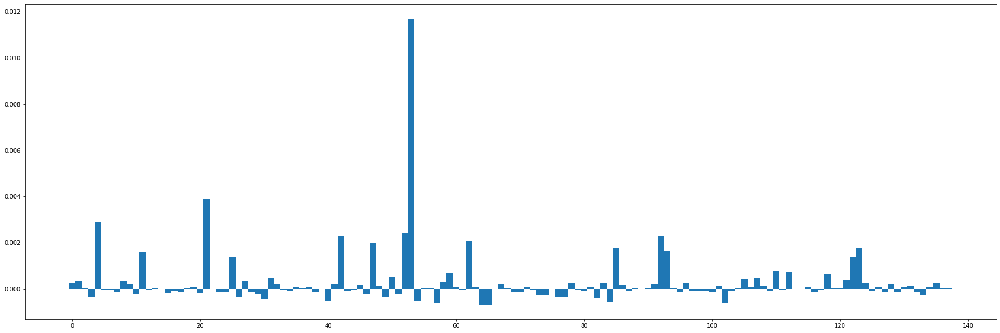

[1 3 4 5] [111  12   7   8]


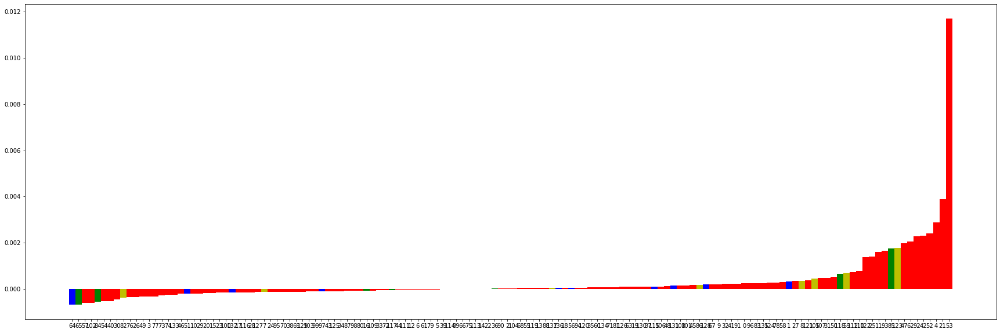

In [ ]:
analysis_shap(14,model)

model output [[0.96980953 0.01324078 0.0169497 ]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


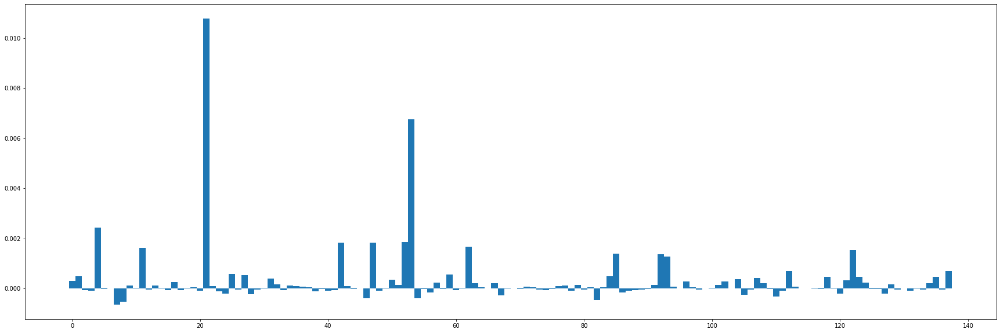

[1 3 4 5] [111  12   7   8]


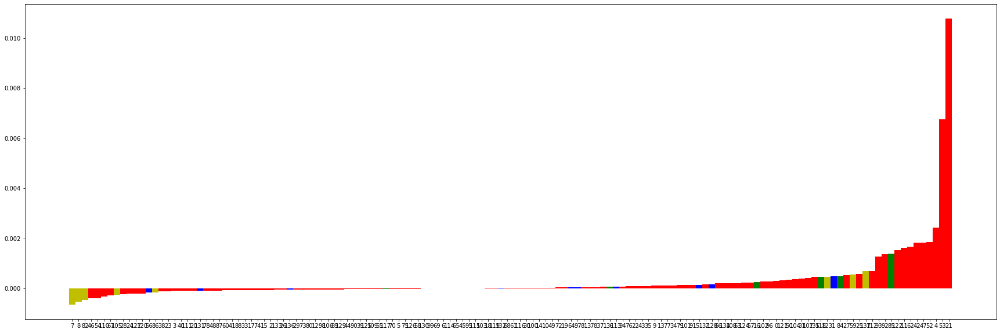

In [ ]:
analysis_shap(16,model)

model output [[0.59242815 0.3884968  0.01907503]] 0
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


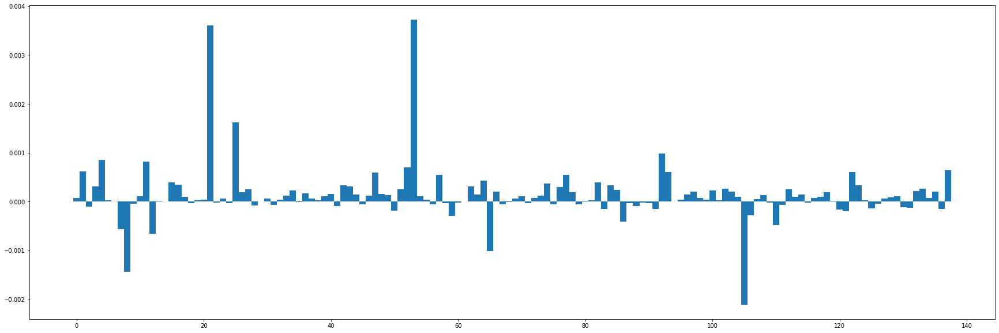

[1 3 4 5] [111  12   7   8]


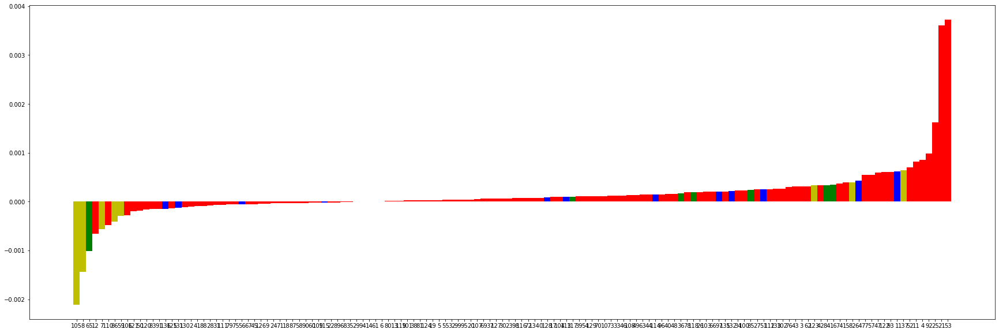

In [ ]:
analysis_shap(18,model)

In [ ]:
analysis_shap(22,model)

model output [[0.02803164 0.00205771 0.9699107 ]] 0
ypred not equal to ylabel


#label = 1

model output [[0.04580809 0.9510926  0.00309929]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


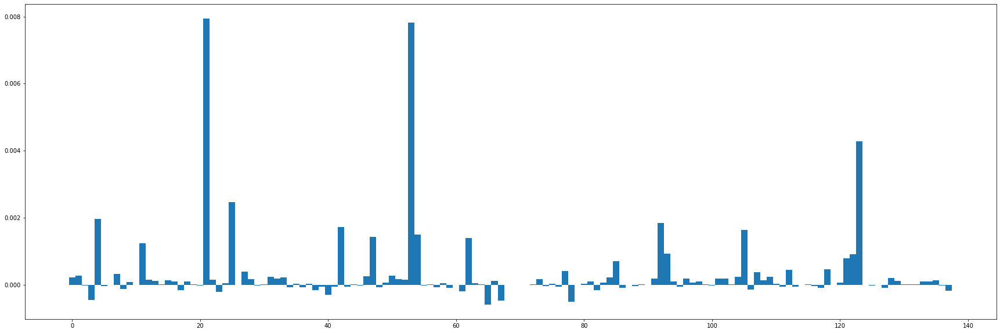

[1 3 4 5] [111  12   7   8]


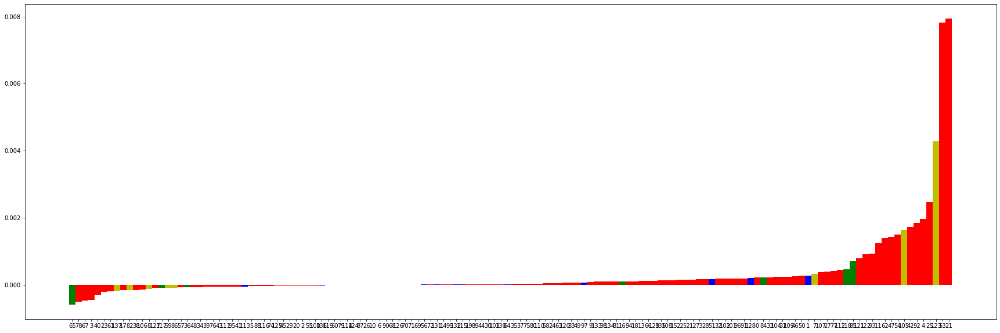

In [ ]:
analysis_shap(1,model)

model output [[0.06359767 0.93166435 0.00473789]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


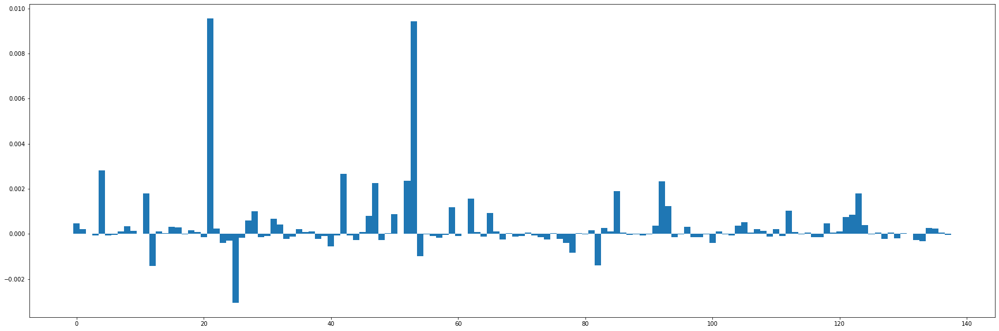

[1 3 4 5] [111  12   7   8]


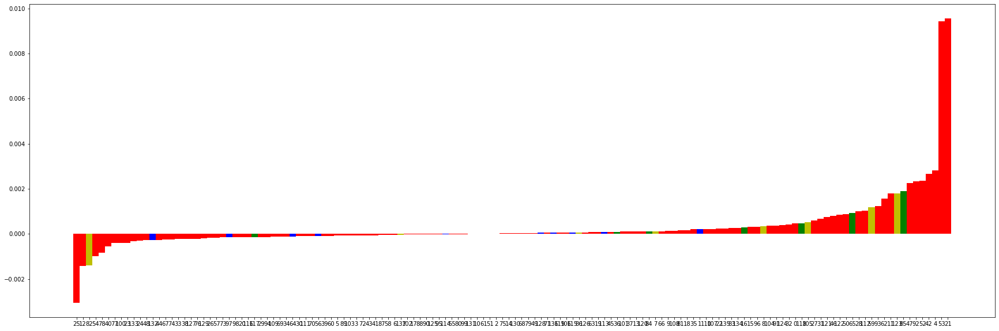

In [ ]:
analysis_shap(6,model)

model output [[0.41526702 0.57308704 0.01164601]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


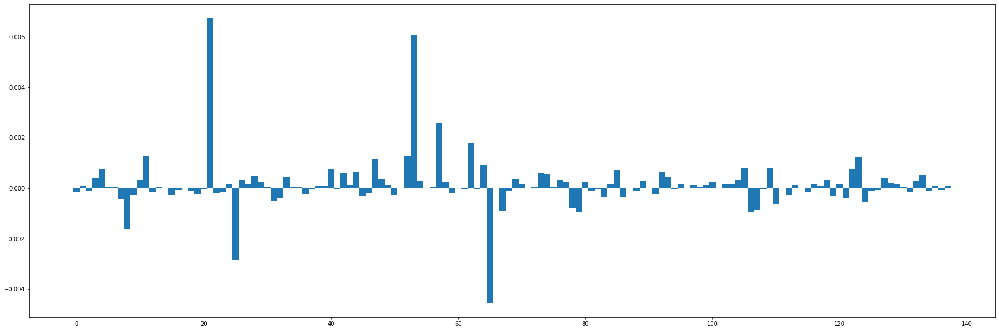

[1 3 4 5] [111  12   7   8]


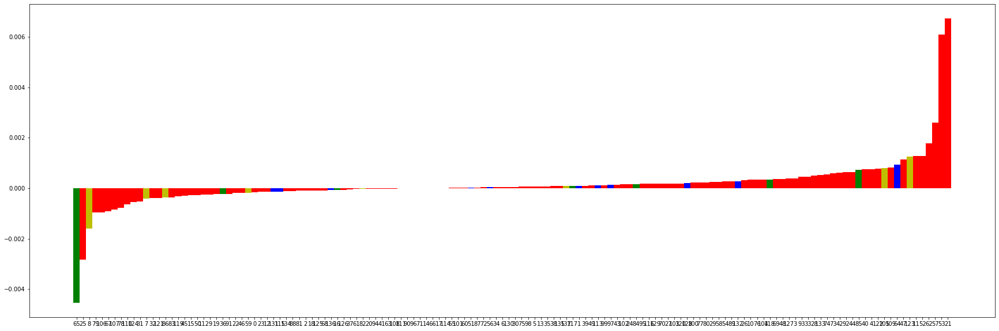

In [ ]:
analysis_shap(7,model)

model output [[0.06898528 0.92721367 0.00380097]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


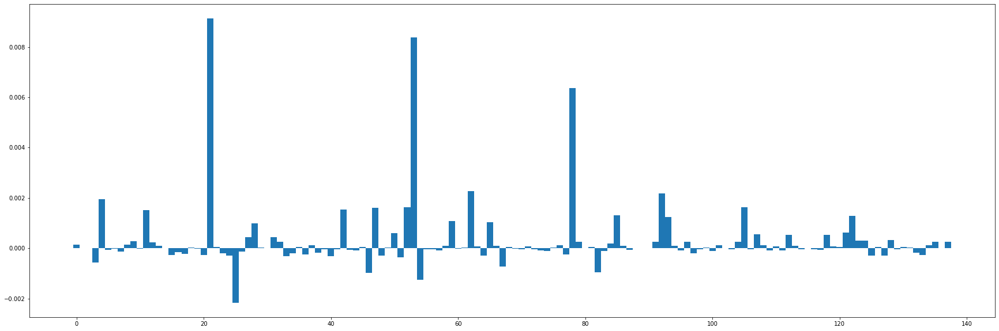

[1 3 4 5] [111  12   7   8]


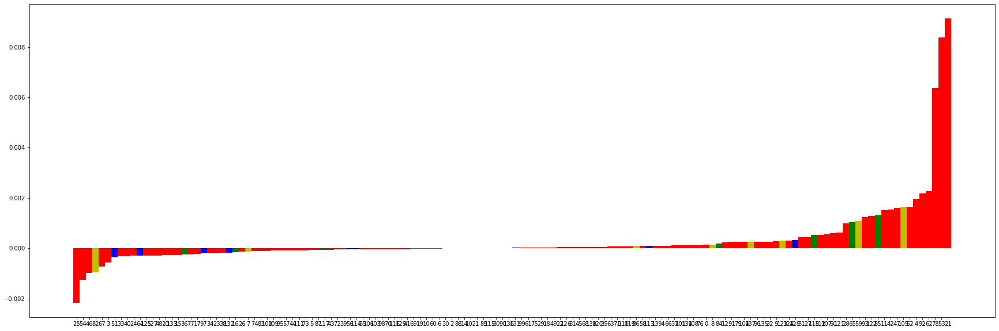

In [ ]:
analysis_shap(8,model)

model output [[0.04728871 0.94801337 0.00469786]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


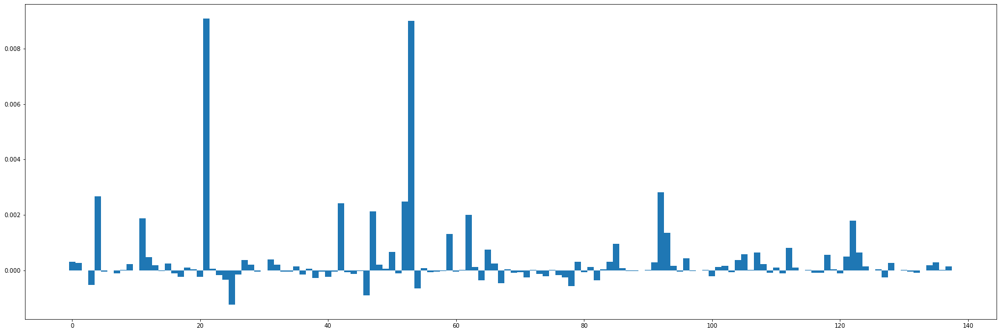

[1 3 4 5] [111  12   7   8]


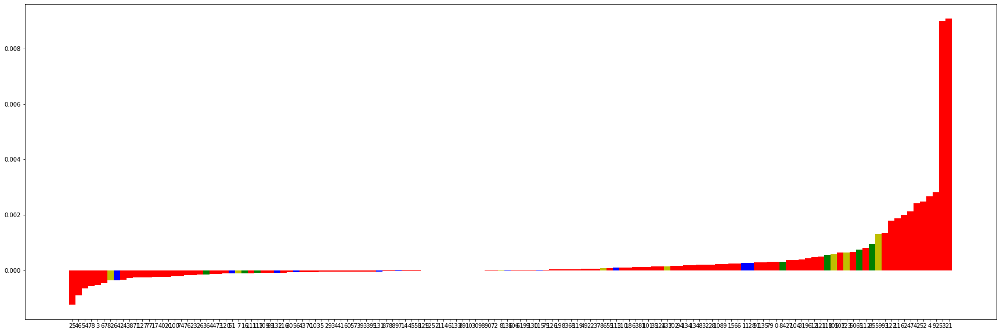

In [ ]:
analysis_shap(9,model)

model output [[0.05329603 0.9438889  0.00281507]] 1
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


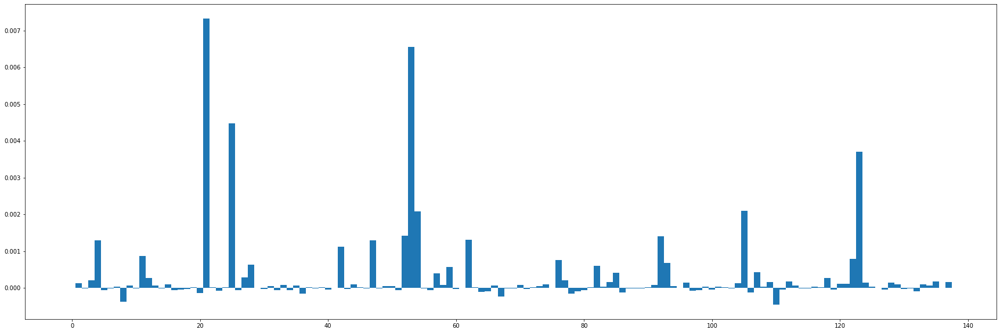

[1 3 4 5] [111  12   7   8]


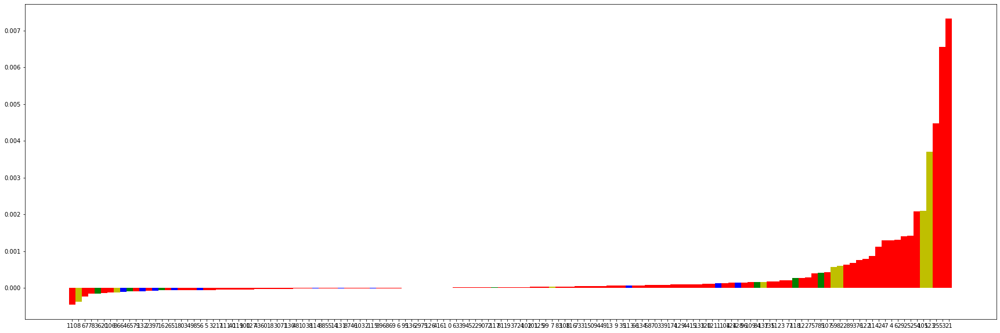

In [ ]:
analysis_shap(24,model)

#label = 2

model output [[0.01423127 0.00276895 0.98299974]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


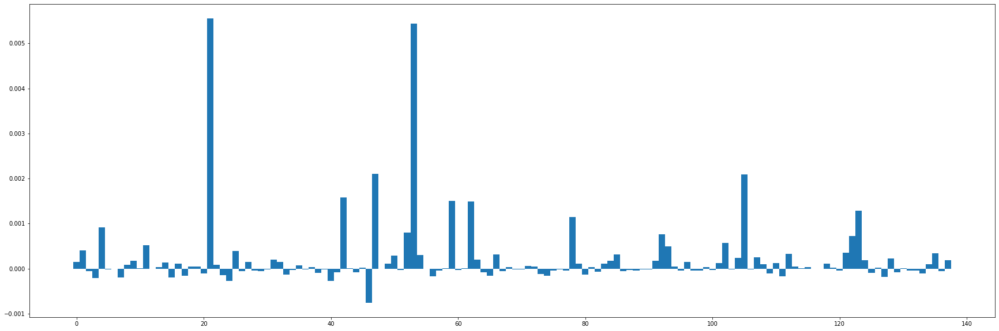

[1 3 4 5] [111  12   7   8]


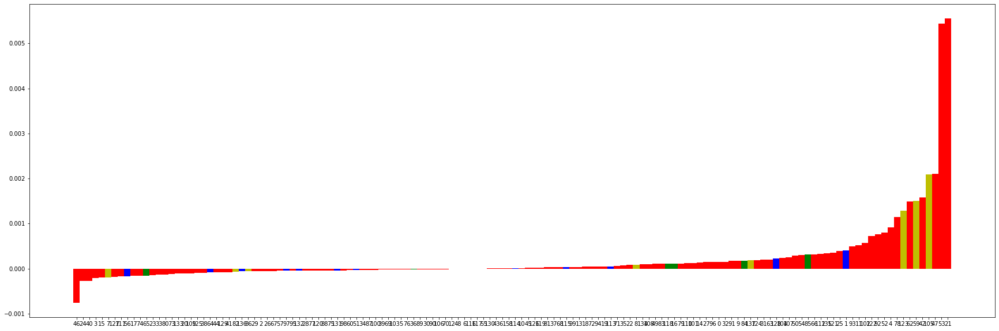

In [ ]:
analysis_shap(0,model)

model output [[0.0140124  0.00302822 0.9829594 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


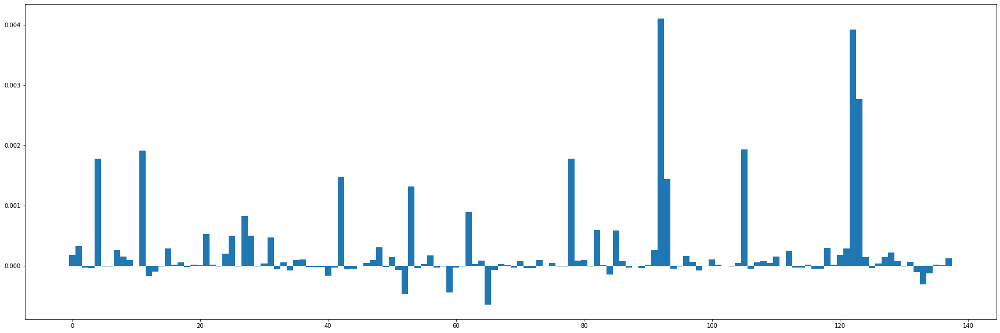

[1 3 4 5] [111  12   7   8]


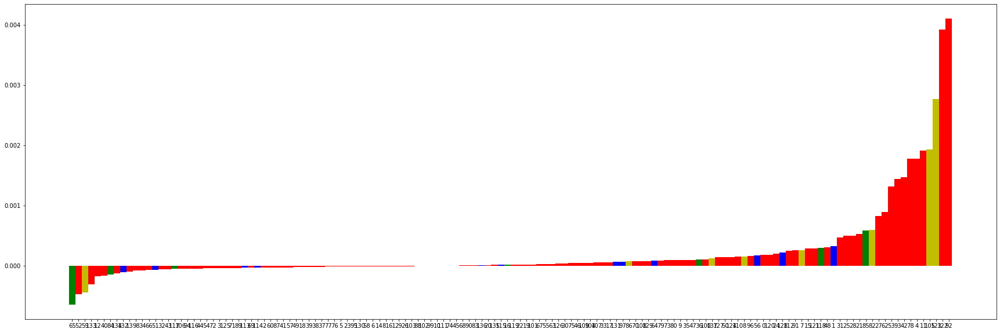

In [ ]:
analysis_shap(2,model)

model output [[0.01342685 0.00294384 0.9836293 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


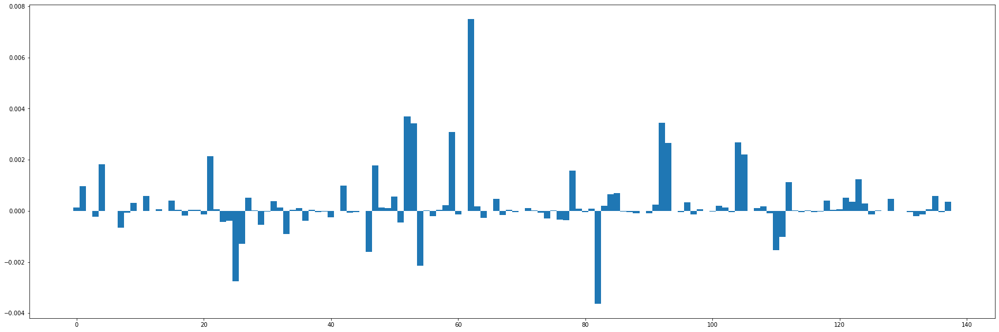

[1 3 4 5] [111  12   7   8]


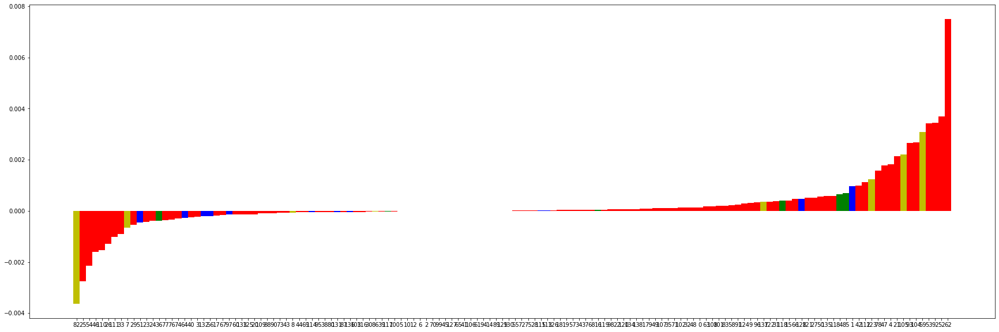

In [ ]:
analysis_shap(3,model)

model output [[0.01393542 0.00288554 0.983179  ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


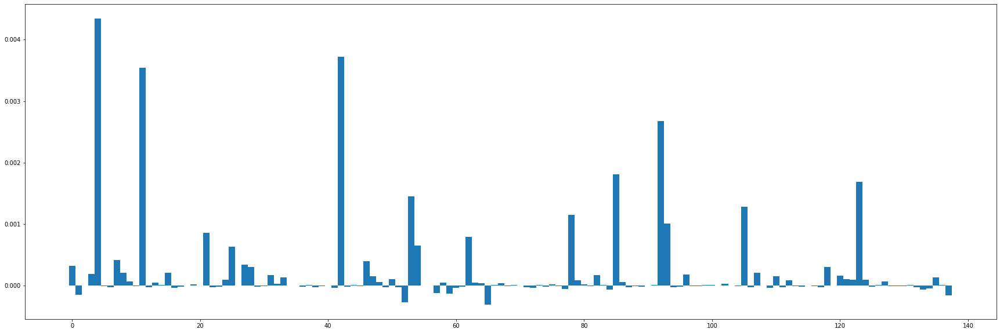

[1 3 4 5] [111  12   7   8]


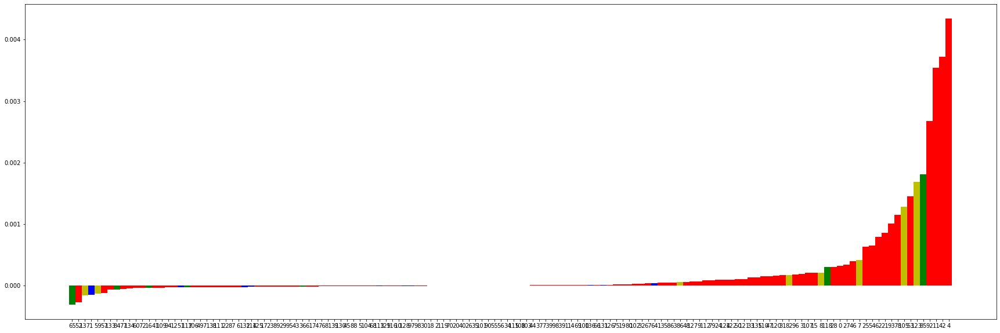

In [ ]:
analysis_shap(10,model)

model output [[0.01403694 0.00291986 0.98304313]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


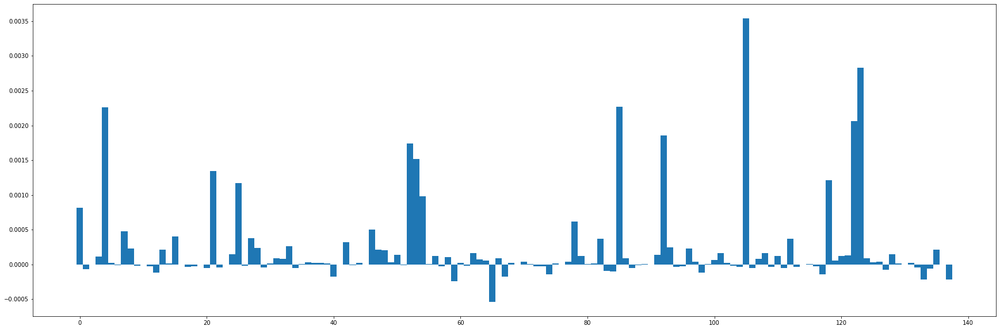

[1 3 4 5] [111  12   7   8]


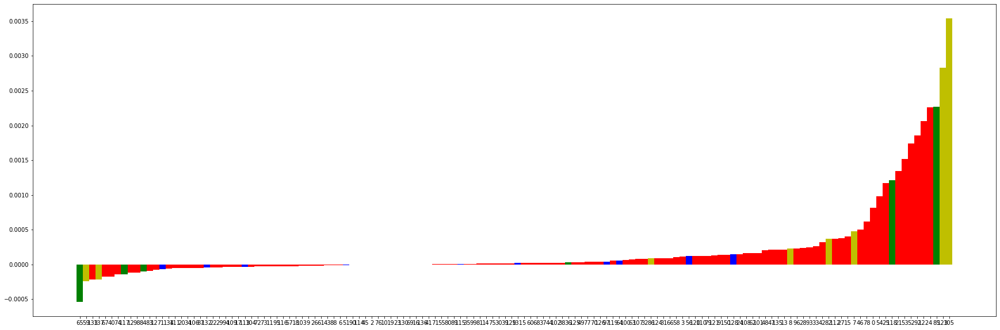

In [ ]:
analysis_shap(12,model)

model output [[0.01401658 0.00299509 0.9829883 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


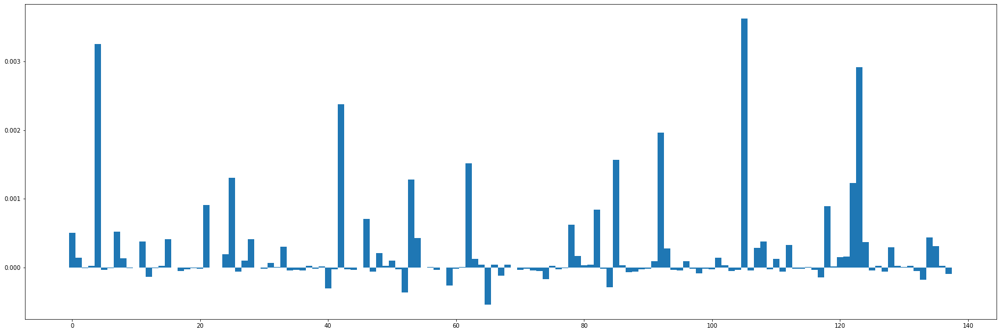

[1 3 4 5] [111  12   7   8]


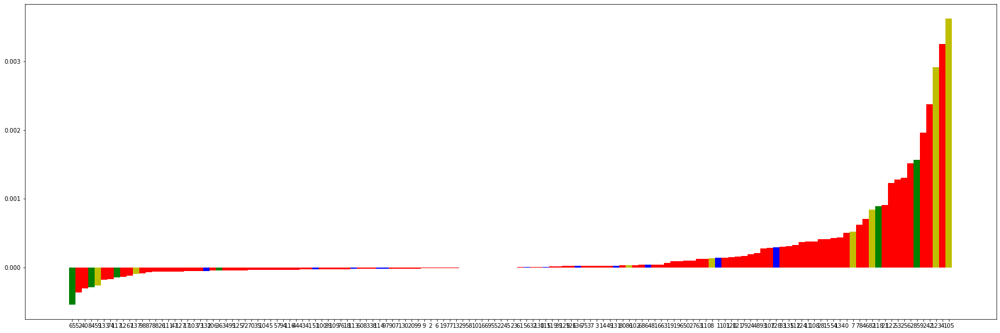

In [ ]:
analysis_shap(15,model)

model output [[0.0138643  0.00282252 0.98331314]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


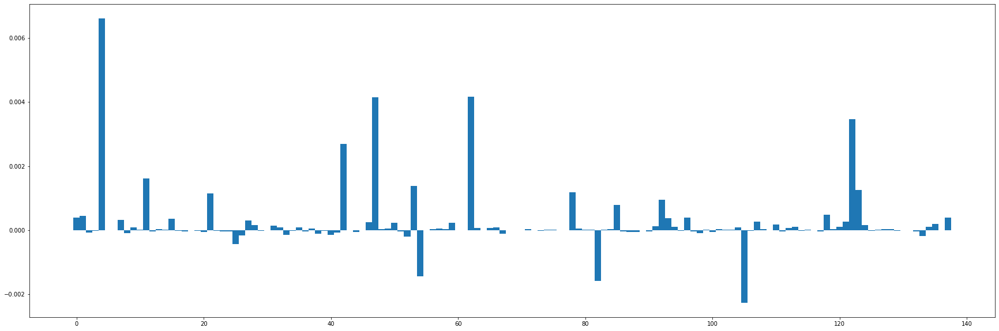

[1 3 4 5] [111  12   7   8]


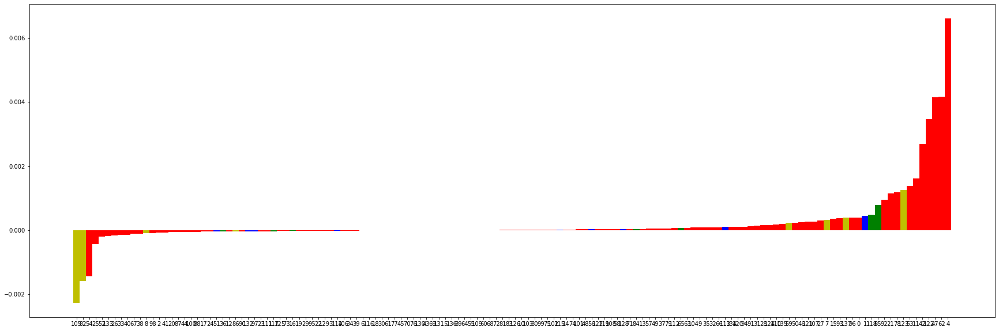

In [ ]:
analysis_shap(17,model)

model output [[0.01411758 0.00281045 0.9830719 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


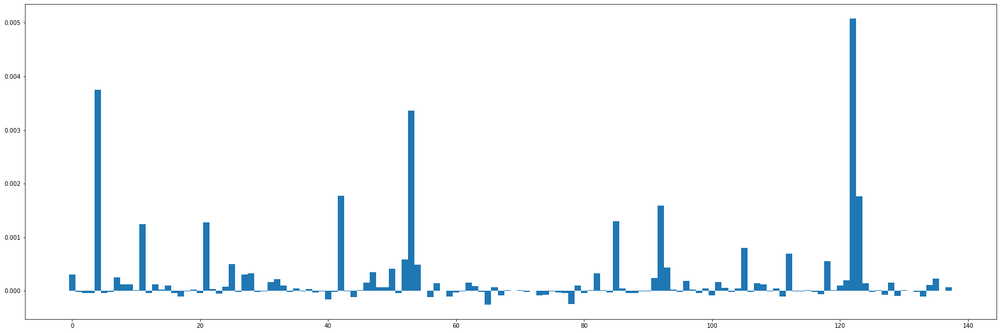

[1 3 4 5] [111  12   7   8]


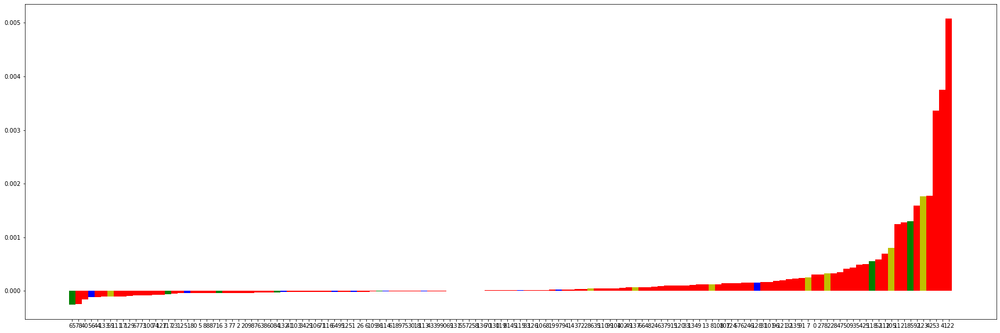

In [ ]:
analysis_shap(19,model)

model output [[0.01415817 0.00262861 0.9832132 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


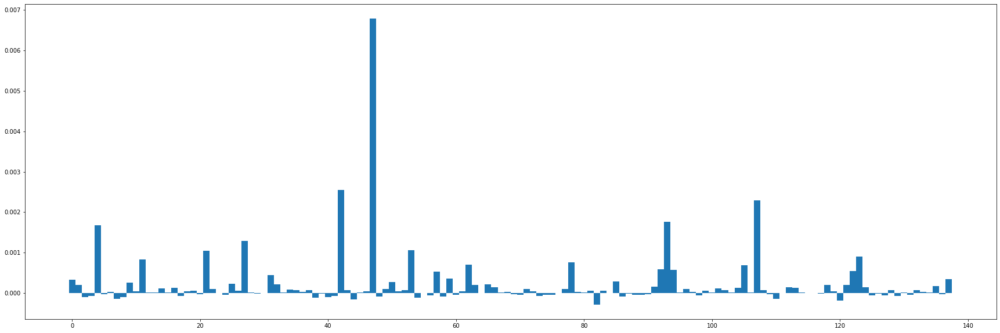

[1 3 4 5] [111  12   7   8]


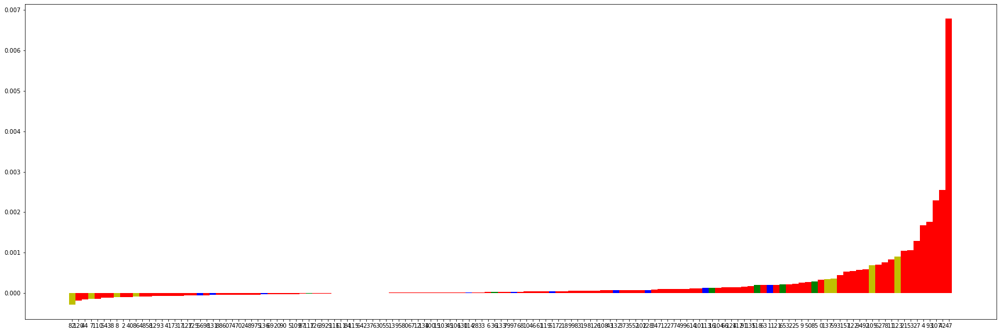

In [ ]:
analysis_shap(20,model)

model output [[0.01401884 0.00288619 0.983095  ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


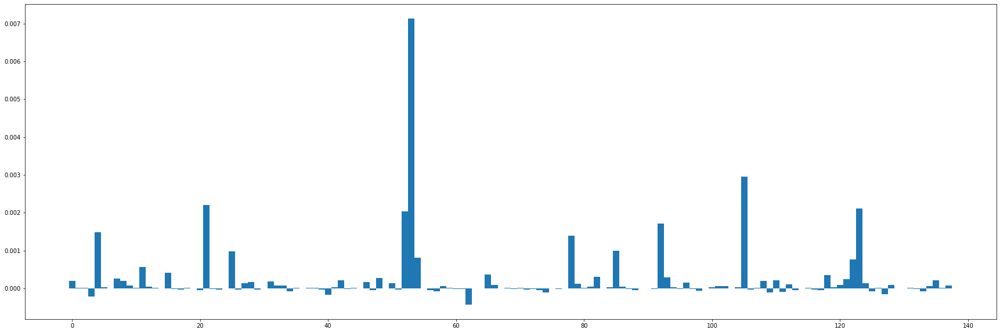

[1 3 4 5] [111  12   7   8]


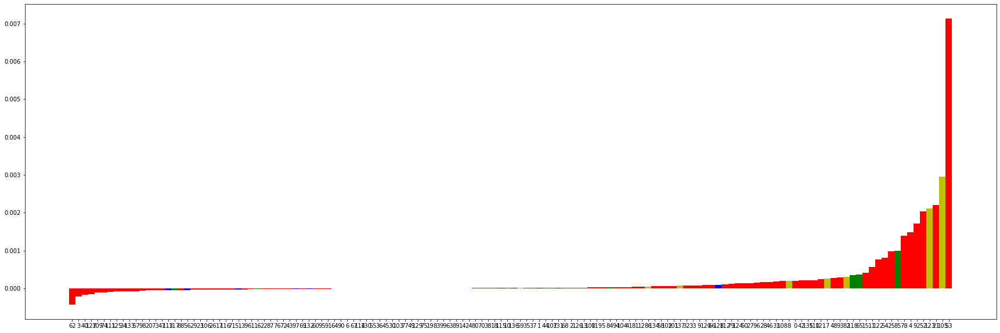

In [ ]:
analysis_shap(21,model)

model output [[0.01412866 0.00290805 0.9829633 ]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


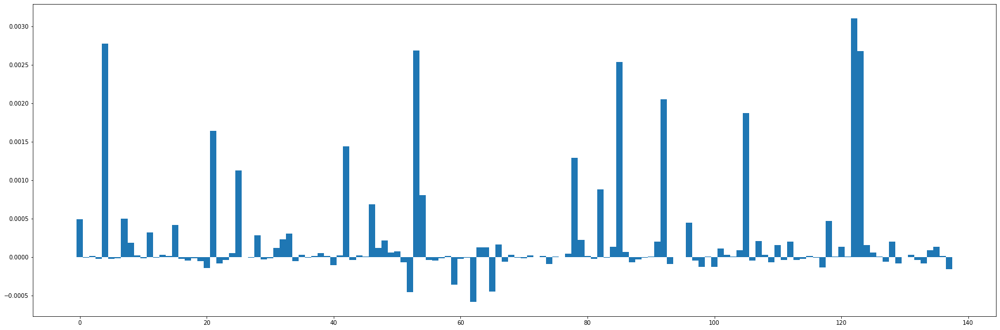

[1 3 4 5] [111  12   7   8]


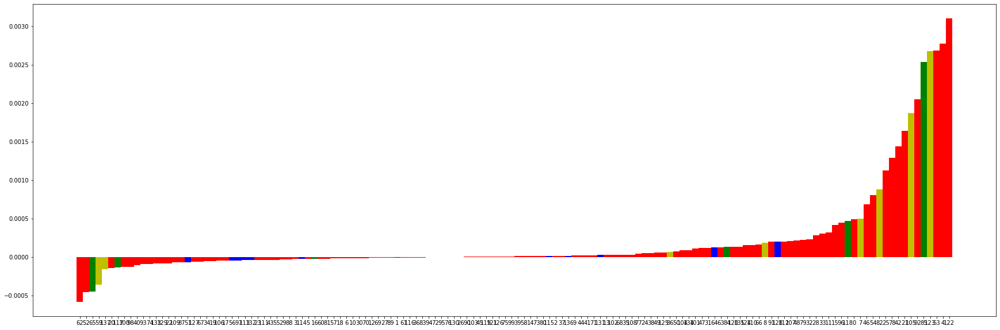

In [ ]:
analysis_shap(23,model)

model output [[0.01382777 0.00290271 0.98326945]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


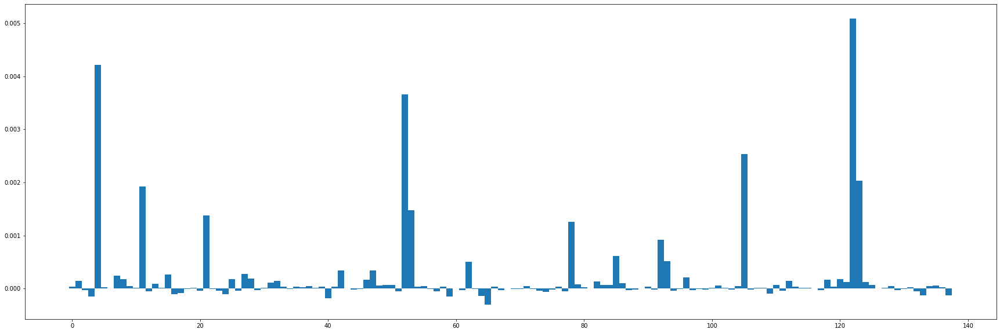

[1 3 4 5] [111  12   7   8]


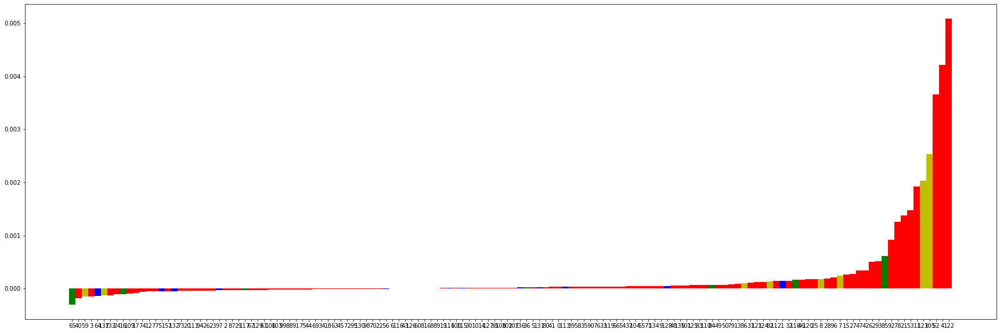

In [ ]:
analysis_shap(25,model)

model output [[0.0141148  0.00276038 0.98312485]] 2
shap output [0.2794182  0.23259489 0.48798674]


Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


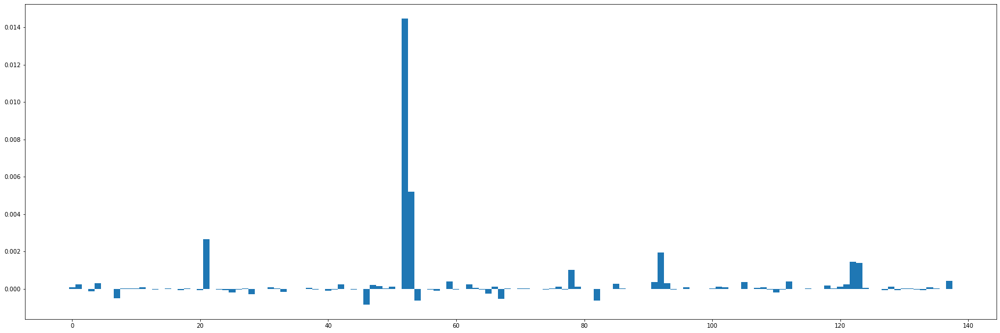

[1 3 4 5] [111  12   7   8]


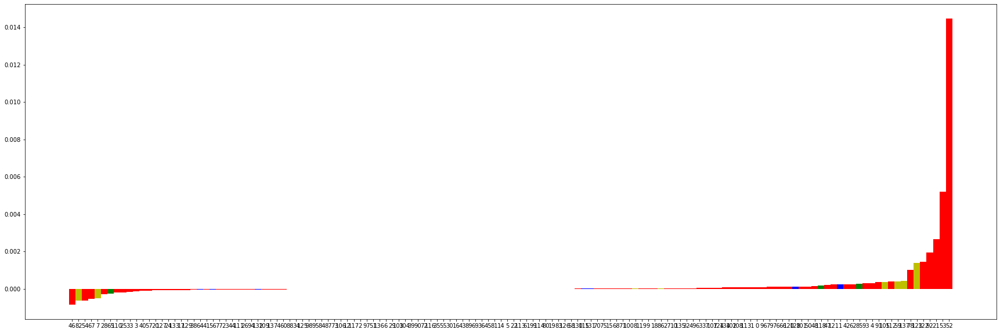

In [ ]:
analysis_shap(26,model)

# Extras

In [ ]:
b = X_test[0].reshape(1,17,138)
print(b.shape)
ypred = model.predict(b)
print(ypred)
print(y_test[0])

(1, 17, 138)
[[0.01423127 0.00276895 0.98299974]]
2


`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.


In [ ]:
np.argmax(ypred)

2

In [ ]:
features = list(range(0,138))
explainer = shap.DeepExplainer(model, X_trn)
print(type(explainer))

keras is no longer supported, please use tf.keras instead.
Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.


<class 'shap.explainers._deep.Deep'>


In [ ]:
print(explainer.expected_value)

[0.2794182  0.23259489 0.48798674]


In [ ]:
shap_values = explainer.shap_values(b)
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0][2], features) #

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0][2], features) #

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[2][0][2], features) #

In [ ]:
print(np.array(shap_values).shape) # axis = 0 represent shap values for each decision taken(y =0,1,2)

(3, 1, 17, 138)


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[2], shap_values[2][0][2], features)

In [ ]:
shap_values[0][0].shape

(17, 138)

In [ ]:
mean = np.mean(shap_values[0][0],axis = 0) #mean value for all time steps along axis = 0 with y =0
shap.initjs()
shap.force_plot(explainer.expected_value[0], mean, features)

In [ ]:
mean1 = np.mean(shap_values[1][0],axis = 0) #mean value for all time steps when y = 1
shap.initjs()
shap.force_plot(explainer.expected_value[1], mean1, features)

In [ ]:
mean2 = np.mean(shap_values[2][0],axis = 0) #mean value for all time steps when y = 2
shap.initjs()
shap.force_plot(explainer.expected_value[2], mean2, features)

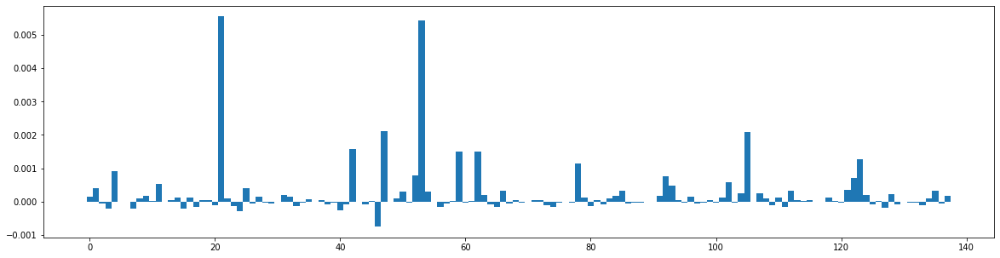

In [ ]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
plt.bar(features,mean2,1)
plt.show()

In [ ]:
ind = np.argsort(mean2)
print(ind)

[ 46  24  40   3  15   7 127 111  56  17  74  65  23  33  80  73 133  20
 109 125  38  64  44 129  41  82 136  86  29   2  26  67  57  97  95 132
  28  77 120  88  75 131  98  60  51  34  87 100  39  69 103   5  76  36
  89  30  90 106  70  12  48   6 116 117  55 130  43  61  58 114  10  45
 126 119  81  37  68 115  99  13  18  72  94  19 113  71  35  22   8 134
 108  49  83 118  16  79 110 101  14  27  96   0  32  91   9  84 137 124
  31  63 128 104 107  50  54  85  66 112 135 121  25   1  93  11 102 122
  92  52   4  78 123  62  59  42 105  47  53  21]


In [ ]:
a = data['CELLLAB_ALL'][0][0].reshape(138)
unique, counts = np.unique(a, return_counts=True)

In [ ]:
print(unique,counts)

[1 3 4 5] [111  12   7   8]


In [ ]:
 a = np.array([1]*111 + [3]*12 + [4]*7 + [5]*8)

NameError: ignored

In [ ]:
colors = []
for i in a[ind]:
  if(i == 1):
    colors.append('r') #PYR
  elif(i == 3):
    colors.append('b') #PV
  elif(i == 4):
    colors.append('g') #SOM
  elif(i == 5):
    colors.append('y') #VIP
  else:
    colors.append('m') #others

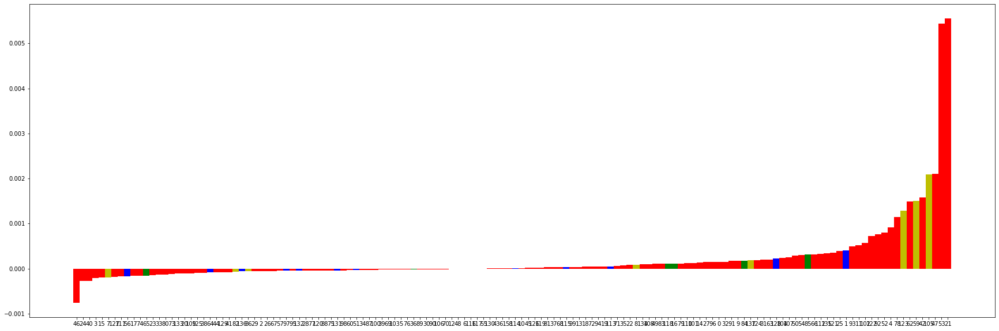

In [ ]:
plt.rcParams["figure.figsize"] = (30,10)
plt.bar(list(map(str,ind)),mean2[ind],1,color = colors)
plt.show()

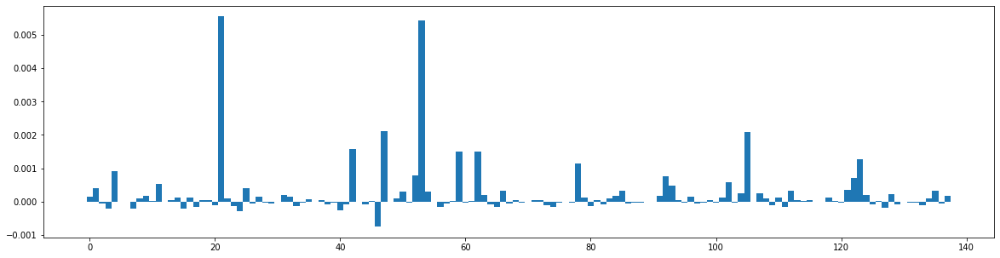

In [ ]:
plt.bar(ind,1,width = 1, color = colors)
plt.show()